In [5]:
import pandas as pd
import re
import numpy as np
import regex as re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from dash import Dash, dcc, html, Input, Output
import dash_bootstrap_components as dbc

from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn import set_config

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [6]:
plt.style.use('ggplot')

# Load dữ liệu 

In [7]:
business = pd.read_csv("business.csv")
data = pd.read_csv("Clean_Dataset.csv")
economy = pd.read_csv("economy.csv")

In [8]:
data = data.iloc[:,1:]

In [9]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [10]:
economy

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,non-stop,21:05,Mumbai,"5,953"
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,non-stop,08:40,Mumbai,"5,953"
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,non-stop,06:35,Mumbai,"5,956"
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,non-stop,12:35,Mumbai,"5,955"
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,non-stop,11:10,Mumbai,"5,955"
...,...,...,...,...,...,...,...,...,...,...,...
206769,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"7,697"
206770,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"7,709"
206771,31-03-2022,Vistara,UK,826,12:30,Chennai,20h 35m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,09:05,Hyderabad,"8,640"
206772,31-03-2022,Vistara,UK,822,09:45,Chennai,23h 20m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,09:05,Hyderabad,"8,640"


In [11]:
economy.shape[0] + business.shape[0]

300261

# Xử lí dữ liệu 

Dữ liệu được chia làm 2 bảng khác nhau:
* 1 bảng là các hãng máy bay hạng `thương gia`
* 1 bảng là các hãng máy bay hạng `phổ thông`

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   airline           300153 non-null  object 
 1   flight            300153 non-null  object 
 2   source_city       300153 non-null  object 
 3   departure_time    300153 non-null  object 
 4   stops             300153 non-null  object 
 5   arrival_time      300153 non-null  object 
 6   destination_city  300153 non-null  object 
 7   class             300153 non-null  object 
 8   duration          300153 non-null  float64
 9   days_left         300153 non-null  int64  
 10  price             300153 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 25.2+ MB


In [13]:
economy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206774 entries, 0 to 206773
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        206774 non-null  object
 1   airline     206774 non-null  object
 2   ch_code     206774 non-null  object
 3   num_code    206774 non-null  int64 
 4   dep_time    206774 non-null  object
 5   from        206774 non-null  object
 6   time_taken  206774 non-null  object
 7   stop        206774 non-null  object
 8   arr_time    206774 non-null  object
 9   to          206774 non-null  object
 10  price       206774 non-null  object
dtypes: int64(1), object(10)
memory usage: 17.4+ MB


In [14]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93487 entries, 0 to 93486
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   date        93487 non-null  object
 1   airline     93487 non-null  object
 2   ch_code     93487 non-null  object
 3   num_code    93487 non-null  int64 
 4   dep_time    93487 non-null  object
 5   from        93487 non-null  object
 6   time_taken  93487 non-null  object
 7   stop        93487 non-null  object
 8   arr_time    93487 non-null  object
 9   to          93487 non-null  object
 10  price       93487 non-null  object
dtypes: int64(1), object(10)
memory usage: 7.8+ MB


Bộ dataset này k chứa dữ liệu thiếu, các thuộc tính đều có kiểu dữ liệu hợp lệ trừ thuộc tính price có kiểu đữ liệu không hợp lệ

### Chuyển price thành kiểu thích hợp

In [15]:
economy['price'] = economy['price'].str.replace(',','').astype(int)
business['price'] = business['price'].str.replace(',','').astype(int)


### Chuyển thuộc tính `date` sang kiểu dữ liệu date

In [16]:
economy['date'] = pd.to_datetime(economy['date'],format="%d-%m-%Y")
business['date'] = pd.to_datetime(business['date'],format="%d-%m-%Y")

### Chuyển sang minute

In [17]:
def getHour(x):
    return int(float(x[:re.search("h",x).start()]))
def getMinute(x):
    try:
        return int(float(x[re.search("h",x).start()+2:-1]))
    except:
        return 0


In [18]:
business['time_taken'] = business['time_taken'].apply(lambda x: round((getHour(x)*60 + getMinute(x))/60,2)).astype(float)
economy['time_taken'] = economy['time_taken'].apply(lambda x: round((getHour(x)*60 + getMinute(x))/60,2)).astype(float)

In [19]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93487 entries, 0 to 93486
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        93487 non-null  datetime64[ns]
 1   airline     93487 non-null  object        
 2   ch_code     93487 non-null  object        
 3   num_code    93487 non-null  int64         
 4   dep_time    93487 non-null  object        
 5   from        93487 non-null  object        
 6   time_taken  93487 non-null  float64       
 7   stop        93487 non-null  object        
 8   arr_time    93487 non-null  object        
 9   to          93487 non-null  object        
 10  price       93487 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(1), object(7)
memory usage: 7.5+ MB


In [20]:
economy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206774 entries, 0 to 206773
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   date        206774 non-null  datetime64[ns]
 1   airline     206774 non-null  object        
 2   ch_code     206774 non-null  object        
 3   num_code    206774 non-null  int64         
 4   dep_time    206774 non-null  object        
 5   from        206774 non-null  object        
 6   time_taken  206774 non-null  float64       
 7   stop        206774 non-null  object        
 8   arr_time    206774 non-null  object        
 9   to          206774 non-null  object        
 10  price       206774 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(1), object(7)
memory usage: 16.6+ MB


### Chuyển `Departure Time` sang phân loại

* Early Morning: 6-9 
* Morning: 9-12 
* Afternoon: 12-18  
* Evening: 18 - 21
* Night: 21-24
* Late-Night: 24-6

In [21]:
data['departure_time'].value_counts()

Morning          71146
Early_Morning    66790
Evening          65102
Night            48015
Afternoon        47794
Late_Night        1306
Name: departure_time, dtype: int64

In [22]:
def changeTime(x):
    rg = re.search(":",x).start()
    hour = int(x[:rg])
    if hour >= 6 and hour < 9:
        return "Early_Morning"
    if hour >= 9 and hour < 12:
        return "Morning"
    if hour >= 12 and hour < 18:
        return "Afternoon"
    if hour >= 18 and hour < 21:
        return "Evening"
    if hour >= 21 and hour < 24:
        return "Night"
    if hour >= 0 and hour < 6:
        return "Late_Night"
    

In [23]:
economy['dep_time'] = economy['dep_time'].apply(lambda x: changeTime(x))
business['dep_time'] = business['dep_time'].apply(lambda x: changeTime(x))

In [24]:
economy['arr_time'] = economy['arr_time'].apply(lambda x: changeTime(x))
business['arr_time'] = business['arr_time'].apply(lambda x: changeTime(x))

In [25]:
economy

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,2022-02-11,SpiceJet,SG,8709,Evening,Delhi,2.17,non-stop,Night,Mumbai,5953
1,2022-02-11,SpiceJet,SG,8157,Early_Morning,Delhi,2.33,non-stop,Early_Morning,Mumbai,5953
2,2022-02-11,AirAsia,I5,764,Late_Night,Delhi,2.17,non-stop,Early_Morning,Mumbai,5956
3,2022-02-11,Vistara,UK,995,Morning,Delhi,2.25,non-stop,Afternoon,Mumbai,5955
4,2022-02-11,Vistara,UK,963,Early_Morning,Delhi,2.33,non-stop,Morning,Mumbai,5955
...,...,...,...,...,...,...,...,...,...,...,...
206769,2022-03-31,Vistara,UK,832,Early_Morning,Chennai,13.83,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,Evening,Hyderabad,7697
206770,2022-03-31,Vistara,UK,832,Early_Morning,Chennai,13.83,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,Evening,Hyderabad,7709
206771,2022-03-31,Vistara,UK,826,Afternoon,Chennai,20.58,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,Morning,Hyderabad,8640
206772,2022-03-31,Vistara,UK,822,Morning,Chennai,23.33,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,Morning,Hyderabad,8640


drop các dòng sai

In [26]:
economy.drop(economy[economy['ch_code'] == 'S5'].index,inplace = True)
economy.drop(economy[economy['ch_code'] == '2T'].index,inplace = True)

# Khám phá dữ liệu 

## Tỉ lệ vé phổ thông và thương gia

([<matplotlib.patches.Wedge at 0x22c800542b0>,
 [Text(-0.6141171796952766, 0.9126116860982658, 'Economy'),
  Text(0.6141170942504008, -0.9126117435960621, 'Business')],
 [Text(-0.33497300710651445, 0.4977881924172358, '69%'),
  Text(0.3349729605002186, -0.49778822377967014, '31%')])

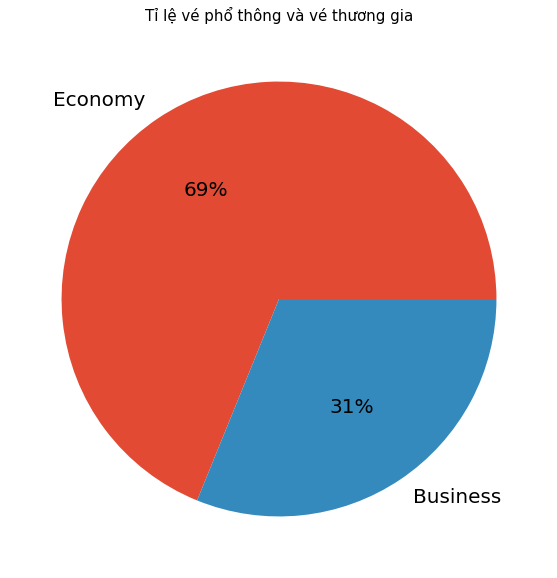

In [27]:
plt.figure(figsize = (10,10))
plt.title("Tỉ lệ vé phổ thông và vé thương gia",fontsize = 15)
plt.pie([len(economy)/len(data),len(business)/len(data)],labels = ['Economy','Business'],autopct='%.0f%%',textprops={'fontsize': 20})

## Vẽ biểu đồ đường bay

In [28]:
des_city = np.unique(data['destination_city'])
src_city = np.unique(data['source_city'])

In [29]:
print("Các thành phố cần đến:",src_city)

Các thành phố cần đến: ['Bangalore' 'Chennai' 'Delhi' 'Hyderabad' 'Kolkata' 'Mumbai']


In [30]:
f = 0
for src in src_city:
    if len (np.unique(data[data['source_city'] == src]['destination_city'])) != 5:
        f = 1
if not f:
    print("Có đường bay giữa các thành phố với nhau ")

Có đường bay giữa các thành phố với nhau 


### Các điểm dừng

In [31]:
def findStop(sent):
    try:
        fr = re.search(" ",sent).start()
        ed = re.search("\\n",sent[fr+1:]).start()
    except:
        s = re.search("stop",sent).end()
        return sent[:s]
    return sent[fr+1:fr+ed+1]


In [32]:
economy['stop'] = economy['stop'].apply(lambda x: findStop(x))
business['stop'] = business['stop'].apply(lambda x: findStop(x))

Vì các tên này là tương tự nhau nên ta sẽ sửa đổi cho đồng nhất:
* Guwahati == GAU
* Raipur == RPR
* Bhubaneswar == BBI
* Kolhapur == KLH
* Nagpur == NAG
* Ranchi == IXR

In [33]:
def replace_stop(data):
    data['stop'] = data['stop'].replace("GAU","Guwahati")
    data['stop'] = data['stop'].replace("RPR","Raipur")
    data['stop'] = data['stop'].replace("BBI","Bhubaneswar")
    data['stop'] = data['stop'].replace("KLH","Kolhapur")
    data['stop'] = data['stop'].replace("NAG","Nagpur")
    data['stop'] = data['stop'].replace("IXR","Ranchi")
    return data['stop']

In [34]:
business['stop'] = replace_stop(business)
economy['stop'] = replace_stop(economy)

In [35]:
busi = business['stop'].unique()
eco = economy['stop'].unique()

In [36]:
eco

array(['non-stop', '1-stop', 'IXU', 'Chennai', 'Indore', 'Raipur',
       '2+-stop', 'Lucknow', 'GOP', 'Nagpur', 'Surat', 'Hyderabad', 'STV',
       'IDR', 'VTZ', 'Guwahati', 'Vishakhapatnam', 'NDC', 'IXE', 'Patna',
       'PAT', 'Mangalore', 'Mumbai', 'Kolhapur', 'MYQ', 'Kolkata',
       'Delhi', 'JRG', 'Bhubaneswar', 'Ranchi', 'JGB', 'Mysore'],
      dtype=object)

In [37]:
stop_airport = busi.copy()
for i in eco:
    if i not in stop_airport:
        stop_airport = np.append(stop_airport,i)
stop_airport

array(['non-stop', '1-stop', 'IDR', 'IXU', 'Chennai', 'Lucknow', 'STV',
       'Hyderabad', 'GAY', '2+-stop', 'Guwahati', 'VTZ', 'NDC', 'IXE',
       'Raipur', 'PAT', 'Patna', 'Kolkata', 'HYD', 'Delhi', 'Bhubaneswar',
       'Surat', 'Indore', 'GOP', 'Nagpur', 'Vishakhapatnam', 'Mangalore',
       'Mumbai', 'Kolhapur', 'MYQ', 'JRG', 'Ranchi', 'JGB', 'Mysore'],
      dtype=object)

In [38]:
stop_airport = np.delete(stop_airport,np.argwhere(stop_airport== 'non-stop')[0])
stop_airport = np.delete(stop_airport,np.argwhere(stop_airport== '1-stop')[0])
stop_airport = np.delete(stop_airport,np.argwhere(stop_airport== '2+-stop')[0])


#### Econonomy Class

Điểm đầu đến điểm dừng

In [39]:
src_to_dsc_df_economy = economy[(economy['stop'] != 'non-stop')&(economy['stop'] != '1-stop')&(economy['stop'] != '2+-stop')][['from','stop','to','time_taken']]
src_to_dsc_df_economy

,from,stop,to,time_taken
23,Delhi,IXU,Mumbai,3.75
114,Delhi,Chennai,Mumbai,30.08
151,Delhi,Indore,Mumbai,3.50
152,Delhi,IXU,Mumbai,3.75
162,Delhi,Raipur,Mumbai,7.25
...,...,...,...,...
176446,Hyderabad,JGB,Kolkata,35.58
180249,Hyderabad,STV,Chennai,16.92
180250,Hyderabad,STV,Chennai,20.67
180258,Hyderabad,Bhubaneswar,Chennai,28.00


In [40]:
fr_to_stop = set()
for v in src_to_dsc_df_economy.loc[:,['from','stop']].values:
    fr_to_stop.add((v[0],v[1]))
fr_to_stop

{('Bangalore', 'Delhi'),
 ('Bangalore', 'Hyderabad'),
 ('Bangalore', 'Kolhapur'),
 ('Bangalore', 'Kolkata'),
 ('Bangalore', 'MYQ'),
 ('Bangalore', 'Mumbai'),
 ('Bangalore', 'PAT'),
 ('Bangalore', 'Patna'),
 ('Delhi', 'Chennai'),
 ('Delhi', 'GOP'),
 ('Delhi', 'Guwahati'),
 ('Delhi', 'Hyderabad'),
 ('Delhi', 'IDR'),
 ('Delhi', 'IXU'),
 ('Delhi', 'Indore'),
 ('Delhi', 'Lucknow'),
 ('Delhi', 'Nagpur'),
 ('Delhi', 'Raipur'),
 ('Delhi', 'STV'),
 ('Delhi', 'Surat'),
 ('Delhi', 'VTZ'),
 ('Delhi', 'Vishakhapatnam'),
 ('Hyderabad', 'Bhubaneswar'),
 ('Hyderabad', 'JGB'),
 ('Hyderabad', 'Kolhapur'),
 ('Hyderabad', 'MYQ'),
 ('Hyderabad', 'Mysore'),
 ('Hyderabad', 'STV'),
 ('Kolkata', 'Bhubaneswar'),
 ('Kolkata', 'Delhi'),
 ('Kolkata', 'JRG'),
 ('Kolkata', 'PAT'),
 ('Kolkata', 'Patna'),
 ('Kolkata', 'Ranchi'),
 ('Mumbai', 'Chennai'),
 ('Mumbai', 'IDR'),
 ('Mumbai', 'IXE'),
 ('Mumbai', 'IXU'),
 ('Mumbai', 'Indore'),
 ('Mumbai', 'Mangalore'),
 ('Mumbai', 'NDC'),
 ('Mumbai', 'PAT'),
 ('Mumbai', 'Patna'

Điểm dừng đến điểm cuối

In [41]:
stop_to_desc = set()
for v in src_to_dsc_df_economy.loc[:,['stop','to']].values:
    stop_to_desc.add((v[0],v[1]))
stop_to_desc

{('Bhubaneswar', 'Bangalore'),
 ('Bhubaneswar', 'Chennai'),
 ('Bhubaneswar', 'Delhi'),
 ('Bhubaneswar', 'Hyderabad'),
 ('Bhubaneswar', 'Kolkata'),
 ('Bhubaneswar', 'Mumbai'),
 ('Chennai', 'Delhi'),
 ('Chennai', 'Mumbai'),
 ('Delhi', 'Mumbai'),
 ('GOP', 'Bangalore'),
 ('GOP', 'Mumbai'),
 ('Guwahati', 'Kolkata'),
 ('Hyderabad', 'Delhi'),
 ('Hyderabad', 'Kolkata'),
 ('Hyderabad', 'Mumbai'),
 ('IDR', 'Bangalore'),
 ('IDR', 'Chennai'),
 ('IDR', 'Hyderabad'),
 ('IDR', 'Kolkata'),
 ('IXE', 'Delhi'),
 ('IXU', 'Bangalore'),
 ('IXU', 'Chennai'),
 ('IXU', 'Delhi'),
 ('IXU', 'Hyderabad'),
 ('IXU', 'Kolkata'),
 ('IXU', 'Mumbai'),
 ('Indore', 'Bangalore'),
 ('Indore', 'Chennai'),
 ('Indore', 'Delhi'),
 ('Indore', 'Hyderabad'),
 ('Indore', 'Kolkata'),
 ('Indore', 'Mumbai'),
 ('JGB', 'Delhi'),
 ('JGB', 'Kolkata'),
 ('JGB', 'Mumbai'),
 ('JRG', 'Bangalore'),
 ('JRG', 'Delhi'),
 ('JRG', 'Hyderabad'),
 ('JRG', 'Mumbai'),
 ('Kolhapur', 'Bangalore'),
 ('Kolhapur', 'Chennai'),
 ('Kolhapur', 'Delhi'),
 ('Kolh

#### Business Class

Điểm đầu đến điểm dừng

In [42]:
src_to_dsc_df_business = business[(business['stop'] != 'non-stop')&(business['stop'] != '1-stop')&(business['stop'] != '2+-stop')][['from','stop','to','time_taken']]
src_to_dsc_df_business

,from,stop,to,time_taken
41,Delhi,IDR,Mumbai,3.50
42,Delhi,IXU,Mumbai,3.75
76,Delhi,Chennai,Mumbai,30.08
120,Delhi,Lucknow,Mumbai,19.50
121,Delhi,Lucknow,Mumbai,26.83
...,...,...,...,...
80723,Hyderabad,Bhubaneswar,Chennai,28.00
80756,Hyderabad,STV,Chennai,16.92
80758,Hyderabad,STV,Chennai,20.67
80762,Hyderabad,STV,Chennai,31.58


In [43]:
for v in src_to_dsc_df_business.loc[:,['from','stop']].values:
    fr_to_stop.add((v[0],v[1]))
fr_to_stop = sorted(list(fr_to_stop),key = lambda x:x[0])
fr_to_stop

[('Bangalore', 'MYQ'),
 ('Bangalore', 'PAT'),
 ('Bangalore', 'Patna'),
 ('Bangalore', 'HYD'),
 ('Bangalore', 'Kolkata'),
 ('Bangalore', 'Mumbai'),
 ('Bangalore', 'Kolhapur'),
 ('Bangalore', 'Hyderabad'),
 ('Bangalore', 'Delhi'),
 ('Delhi', 'Lucknow'),
 ('Delhi', 'Raipur'),
 ('Delhi', 'Nagpur'),
 ('Delhi', 'Guwahati'),
 ('Delhi', 'GOP'),
 ('Delhi', 'STV'),
 ('Delhi', 'IDR'),
 ('Delhi', 'IXU'),
 ('Delhi', 'GAY'),
 ('Delhi', 'Indore'),
 ('Delhi', 'Surat'),
 ('Delhi', 'VTZ'),
 ('Delhi', 'Hyderabad'),
 ('Delhi', 'Vishakhapatnam'),
 ('Delhi', 'Chennai'),
 ('Hyderabad', 'Kolhapur'),
 ('Hyderabad', 'STV'),
 ('Hyderabad', 'Surat'),
 ('Hyderabad', 'Mysore'),
 ('Hyderabad', 'JGB'),
 ('Hyderabad', 'MYQ'),
 ('Hyderabad', 'Bhubaneswar'),
 ('Kolkata', 'PAT'),
 ('Kolkata', 'Patna'),
 ('Kolkata', 'Bhubaneswar'),
 ('Kolkata', 'Delhi'),
 ('Kolkata', 'Ranchi'),
 ('Kolkata', 'JRG'),
 ('Mumbai', 'PAT'),
 ('Mumbai', 'Raipur'),
 ('Mumbai', 'Patna'),
 ('Mumbai', 'Mangalore'),
 ('Mumbai', 'IDR'),
 ('Mumbai', 'N

Điểm dừng đến điểm cuối

In [44]:
for v in src_to_dsc_df_business.loc[:,['stop','to']].values:
    stop_to_desc.add((v[0],v[1]))
stop_to_desc

{('Bhubaneswar', 'Bangalore'),
 ('Bhubaneswar', 'Chennai'),
 ('Bhubaneswar', 'Delhi'),
 ('Bhubaneswar', 'Hyderabad'),
 ('Bhubaneswar', 'Kolkata'),
 ('Bhubaneswar', 'Mumbai'),
 ('Chennai', 'Delhi'),
 ('Chennai', 'Mumbai'),
 ('Delhi', 'Mumbai'),
 ('GAY', 'Mumbai'),
 ('GOP', 'Bangalore'),
 ('GOP', 'Mumbai'),
 ('Guwahati', 'Kolkata'),
 ('HYD', 'Mumbai'),
 ('Hyderabad', 'Delhi'),
 ('Hyderabad', 'Kolkata'),
 ('Hyderabad', 'Mumbai'),
 ('IDR', 'Bangalore'),
 ('IDR', 'Chennai'),
 ('IDR', 'Delhi'),
 ('IDR', 'Hyderabad'),
 ('IDR', 'Kolkata'),
 ('IDR', 'Mumbai'),
 ('IXE', 'Chennai'),
 ('IXE', 'Delhi'),
 ('IXU', 'Bangalore'),
 ('IXU', 'Chennai'),
 ('IXU', 'Delhi'),
 ('IXU', 'Hyderabad'),
 ('IXU', 'Kolkata'),
 ('IXU', 'Mumbai'),
 ('Indore', 'Bangalore'),
 ('Indore', 'Chennai'),
 ('Indore', 'Delhi'),
 ('Indore', 'Hyderabad'),
 ('Indore', 'Kolkata'),
 ('Indore', 'Mumbai'),
 ('JGB', 'Delhi'),
 ('JGB', 'Kolkata'),
 ('JGB', 'Mumbai'),
 ('JRG', 'Bangalore'),
 ('JRG', 'Delhi'),
 ('JRG', 'Hyderabad'),
 ('JR

#### Xử lí dữ liệu trước khi vẽ đường bay

In [45]:
stop_airport

array(['IDR', 'IXU', 'Chennai', 'Lucknow', 'STV', 'Hyderabad', 'GAY',
       'Guwahati', 'VTZ', 'NDC', 'IXE', 'Raipur', 'PAT', 'Patna',
       'Kolkata', 'HYD', 'Delhi', 'Bhubaneswar', 'Surat', 'Indore', 'GOP',
       'Nagpur', 'Vishakhapatnam', 'Mangalore', 'Mumbai', 'Kolhapur',
       'MYQ', 'JRG', 'Ranchi', 'JGB', 'Mysore'], dtype=object)

In [46]:
city_location = pd.DataFrame({"airport":np.unique(data['source_city']),"lat":[12.9716,13.0827,28.7041,17.3850,22.5726,19.0760],'lon':[77.5946,80.2707,77.1025,78.4867,88.3639,72.8777]})
city_location

,airport,lat,lon
0,Bangalore,12.9716,77.5946
1,Chennai,13.0827,80.2707
2,Delhi,28.7041,77.1025
3,Hyderabad,17.3850,78.4867
4,Kolkata,22.5726,88.3639
5,Mumbai,19.0760,72.8777


lọc các điểm dừng bị trùng 

In [47]:
for s in stop_airport:
    if s in city_location['airport'].values:
        stop_airport = np.delete(stop_airport,np.argwhere(stop_airport== s)[0])
stop_airport

array(['IDR', 'IXU', 'Lucknow', 'STV', 'GAY', 'Guwahati', 'VTZ', 'NDC',
       'IXE', 'Raipur', 'PAT', 'Patna', 'HYD', 'Bhubaneswar', 'Surat',
       'Indore', 'GOP', 'Nagpur', 'Vishakhapatnam', 'Mangalore',
       'Kolhapur', 'MYQ', 'JRG', 'Ranchi', 'JGB', 'Mysore'], dtype=object)

danh sách vị trí sân bay

In [48]:
lat = [22.7264, 19.8678,12.9941, 26.7617, 21.1210, 24.7488, 26.148043, 17.7285, 19.1833, 12.9537, 21.1860, 25.5950, 25.5950, 17.2403, 20.2507, 21.1210,22.7281, 26.7464, 21.0901, 17.7285, 12.9537, 16.6652,21.9161, 23.3173, 19.0739, 12.2278]
long = [75.8051, 75.3958,80.1709, 80.8857, 72.7420, 84.9437, 91.731377, 83.2236, 77.3347, 74.8854, 81.7404, 85.0908, 85.0908, 78.4294, 85.8145, 72.7420, 75.8042, 83.4429, 79.0548, 83.2236, 74.8854, 74.2828, 84.0464, 85.3251, 82.0358, 76.6582]

In [49]:
airport_location = pd.DataFrame({"airport":stop_airport,"lat":lat,"lon":long})

In [50]:
airport_location

,airport,lat,lon
0,IDR,22.726400,75.805100
1,IXU,19.867800,75.395800
2,Lucknow,12.994100,80.170900
3,STV,26.761700,80.885700
4,GAY,21.121000,72.742000
5,Guwahati,24.748800,84.943700
6,VTZ,26.148043,91.731377
7,NDC,17.728500,83.223600
8,IXE,19.183300,77.334700
9,Raipur,12.953700,74.885400


In [51]:
ccat = pd.concat([city_location,airport_location])
ccat

,airport,lat,lon
0,Bangalore,12.971600,77.594600
1,Chennai,13.082700,80.270700
2,Delhi,28.704100,77.102500
3,Hyderabad,17.385000,78.486700
4,Kolkata,22.572600,88.363900
5,Mumbai,19.076000,72.877700
0,IDR,22.726400,75.805100
1,IXU,19.867800,75.395800
2,Lucknow,12.994100,80.170900
3,STV,26.761700,80.885700


Tiến hành vẽ

In [52]:
airport1 = []
airport2 = []
start_lat = []
start_long = []
end_lat = []
end_long = []
rs_apl = ccat.set_index("airport")


In [53]:
for i in fr_to_stop:
    airport1.append(i[0])
    airport2.append(i[1])
    start_lat.append(rs_apl.loc[i[0],'lat'])
    start_long.append(rs_apl.loc[i[0],'lon'])
    end_lat.append(rs_apl.loc[i[1],'lat'])
    end_long.append(rs_apl.loc[i[1],'lon'])

for i in stop_to_desc:
    airport1.append(i[0])
    airport2.append(i[1])
    start_lat.append(rs_apl.loc[i[0],'lat'])
    start_long.append(rs_apl.loc[i[0],'lon'])
    end_lat.append(rs_apl.loc[i[1],'lat'])
    end_long.append(rs_apl.loc[i[1],'lon'])

In [54]:
flight_path = pd.DataFrame({"airport1":airport1,"airport2":airport2,"start_lat":start_lat,"start_long":start_long,"end_lat":end_lat,"end_long":end_long})
flight_path

,airport1,airport2,start_lat,start_long,end_lat,end_long
0,Bangalore,MYQ,12.9716,77.5946,16.6652,74.2828
1,Bangalore,PAT,12.9716,77.5946,21.1860,81.7404
2,Bangalore,Patna,12.9716,77.5946,25.5950,85.0908
3,Bangalore,HYD,12.9716,77.5946,25.5950,85.0908
4,Bangalore,Kolkata,12.9716,77.5946,22.5726,88.3639
...,...,...,...,...,...,...
137,Patna,Mumbai,25.5950,85.0908,19.0760,72.8777
138,GAY,Mumbai,21.1210,72.7420,19.0760,72.8777
139,Kolkata,Delhi,22.5726,88.3639,28.7041,77.1025
140,IDR,Bangalore,22.7264,75.8051,12.9716,77.5946


In [55]:
ccat

,airport,lat,lon
0,Bangalore,12.971600,77.594600
1,Chennai,13.082700,80.270700
2,Delhi,28.704100,77.102500
3,Hyderabad,17.385000,78.486700
4,Kolkata,22.572600,88.363900
5,Mumbai,19.076000,72.877700
0,IDR,22.726400,75.805100
1,IXU,19.867800,75.395800
2,Lucknow,12.994100,80.170900
3,STV,26.761700,80.885700


In [56]:
_mx = np.sqrt((flight_path['start_lat']- flight_path['end_lat'])**2 + (flight_path['start_long']- flight_path['end_long'])**2).max()
_mx 

17.37959450061991

In [57]:
fig_flight_route = go.Figure()

for i in range(len(flight_path)):
    fig_flight_route.add_trace(
        go.Scattermapbox(
            lon = [flight_path['start_long'][i], flight_path['end_long'][i]],
            lat = [flight_path['start_lat'][i], flight_path['end_lat'][i]],
            mode = 'markers+lines',
            line = dict(width = 1,color = 'red'),
            marker = {'size':15,"color" : 'rgb(0, 0, 255)'},
            opacity = 1-(np.sqrt((flight_path['start_lat'][i]- flight_path['end_lat'][i])**2 + (flight_path['start_long'][i]- flight_path['end_long'][i])**2) / _mx)

        )
    )


fig_flight_route.update_layout(
    margin ={'l':0,'t':40,'b':0,'r':0},
    title_text = 'Đường bay của máy bay',
    showlegend = False,
    width=400,
    height=400,

    mapbox = {
        'center': {'lon': 75, 'lat': 15},
        'style': "stamen-terrain",
        'center': {'lon': 82, 'lat': 21},
        'zoom': 3.7},
    template = 'plotly_dark'

)


fig_flight_route.show()

## Số chuyến bay trong tháng

In [58]:
t = data[data.shape[0]-business.shape[0]:data.shape[0]]
t.index = [i for i in range(business.shape[0])]

In [59]:
eco_new = economy.assign(candidates = data['days_left']).rename(columns={"candidates":"days_left"})
busi_new = business.assign(candidates =t['days_left']).rename(columns={"candidates":"days_left"})


In [60]:
eco_new['depart_day'] = pd.to_datetime(eco_new['date']) + pd.to_timedelta(eco_new["days_left"],unit ='d')
eco_new['flight'] = eco_new['ch_code'] + '-' + eco_new['num_code'].astype('str')
eco_new.drop(columns=['ch_code','num_code'],inplace=True)

busi_new['depart_day'] = pd.to_datetime(busi_new['date']) + pd.to_timedelta(busi_new["days_left"],unit ='d')
busi_new['flight'] = busi_new['ch_code'] + '-' + busi_new['num_code'].astype('str')
busi_new.drop(columns=['ch_code','num_code'],inplace=True)

In [61]:
concate = pd.concat([eco_new,busi_new])
concate

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,days_left,depart_day,flight
0,2022-02-11,SpiceJet,Evening,Delhi,2.17,non-stop,Night,Mumbai,5953,1,2022-02-12,SG-8709
1,2022-02-11,SpiceJet,Early_Morning,Delhi,2.33,non-stop,Early_Morning,Mumbai,5953,1,2022-02-12,SG-8157
2,2022-02-11,AirAsia,Late_Night,Delhi,2.17,non-stop,Early_Morning,Mumbai,5956,1,2022-02-12,I5-764
3,2022-02-11,Vistara,Morning,Delhi,2.25,non-stop,Afternoon,Mumbai,5955,1,2022-02-12,UK-995
4,2022-02-11,Vistara,Early_Morning,Delhi,2.33,non-stop,Morning,Mumbai,5955,1,2022-02-12,UK-963
...,...,...,...,...,...,...,...,...,...,...,...,...
93482,2022-03-31,Vistara,Morning,Chennai,10.08,1-stop,Evening,Hyderabad,69265,49,2022-05-19,UK-822
93483,2022-03-31,Vistara,Afternoon,Chennai,10.42,1-stop,Night,Hyderabad,77105,49,2022-05-19,UK-826
93484,2022-03-31,Vistara,Early_Morning,Chennai,13.83,1-stop,Evening,Hyderabad,79099,49,2022-05-19,UK-832
93485,2022-03-31,Vistara,Early_Morning,Chennai,10.00,1-stop,Afternoon,Hyderabad,81585,49,2022-05-19,UK-828


In [62]:
def findAir(flight):
    r = re.search("-",flight).start()
    f = flight[:r]
    d = {"SG":"SpiceJet","I5":"AirAsia","UK":"Vistara","AI":"Air_India","6E":"Indigo","G8":"GO_FIRST"}
    return d[f]


In [63]:
# Cùng mã chuyến bay (day_lefts như nhau), ngày bay, thời điểm bay => cùng 1 chuyến bay => tính là 1 
grp_depart = concate.groupby(by = ['flight','depart_day','dep_time']).agg('count')['price'].reset_index().rename(columns={"price":"count"})
grp_depart['month'] = grp_depart['depart_day'].dt.month
grp_depart['count'] = 1
grp_depart['flight'] = grp_depart['flight'].apply(lambda x: findAir(x))
grp_depart

,flight,depart_day,dep_time,count,month
0,Indigo,2022-03-20,Afternoon,1,3
1,Indigo,2022-03-21,Afternoon,1,3
2,Indigo,2022-03-24,Afternoon,1,3
3,Indigo,2022-03-25,Afternoon,1,3
4,Indigo,2022-03-28,Afternoon,1,3
...,...,...,...,...,...
58514,Vistara,2022-05-12,Evening,1,5
58515,Vistara,2022-05-13,Evening,1,5
58516,Vistara,2022-05-15,Evening,1,5
58517,Vistara,2022-05-17,Evening,1,5


In [64]:
# Đếm các chuyến bay của các hãng
month_flight = grp_depart.groupby(by=['month','flight']).agg('sum').reset_index()
month_flight.drop(month_flight[month_flight['month']==5].index,inplace = True)
month_flight

,month,flight,count
0,2,AirAsia,540
1,2,Air_India,1543
2,2,GO_FIRST,712
3,2,Indigo,3089
4,2,SpiceJet,910
5,2,Vistara,1333
6,3,AirAsia,1734
7,3,Air_India,2984
8,3,GO_FIRST,2733
9,3,Indigo,7040


Text(0.5, 1.0, 'Số chuyến bay của các hãng từ tháng 2 đến tháng 4')

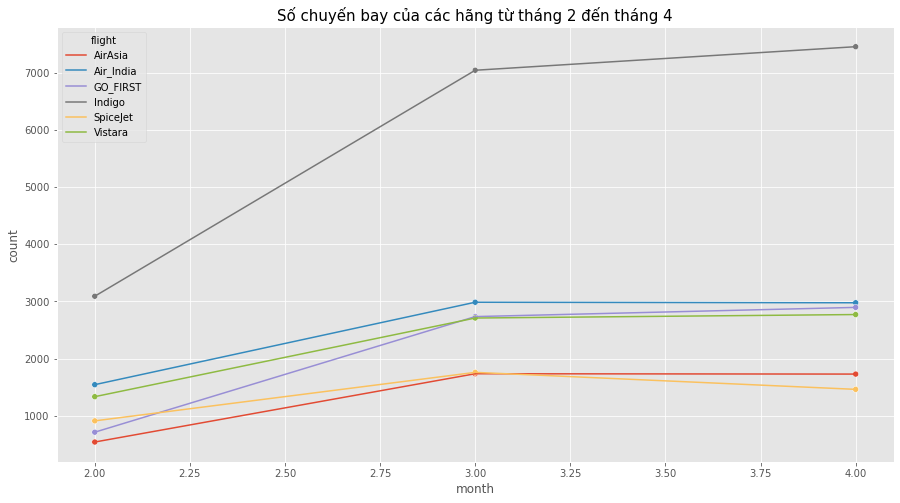

In [65]:
plt.figure(figsize = (15,8))
sns.lineplot(data= month_flight,x='month',y='count',hue='flight')
sns.scatterplot(data=month_flight,x='month',y='count',hue='flight',sizes = 30,legend=False)
plt.title("Số chuyến bay của các hãng từ tháng 2 đến tháng 4",fontsize = 15)

In [66]:
bar3 = month_flight[month_flight['month']==3]
bar3 = bar3.sort_values(by='count',ascending=True)
bar3

,month,flight,count
6,3,AirAsia,1734
10,3,SpiceJet,1758
11,3,Vistara,2708
8,3,GO_FIRST,2733
7,3,Air_India,2984
9,3,Indigo,7040


In [67]:
num_flight = px.bar(bar3,x='count',y='flight',orientation='h',title = "Số lượng chuyến bay trong tháng")


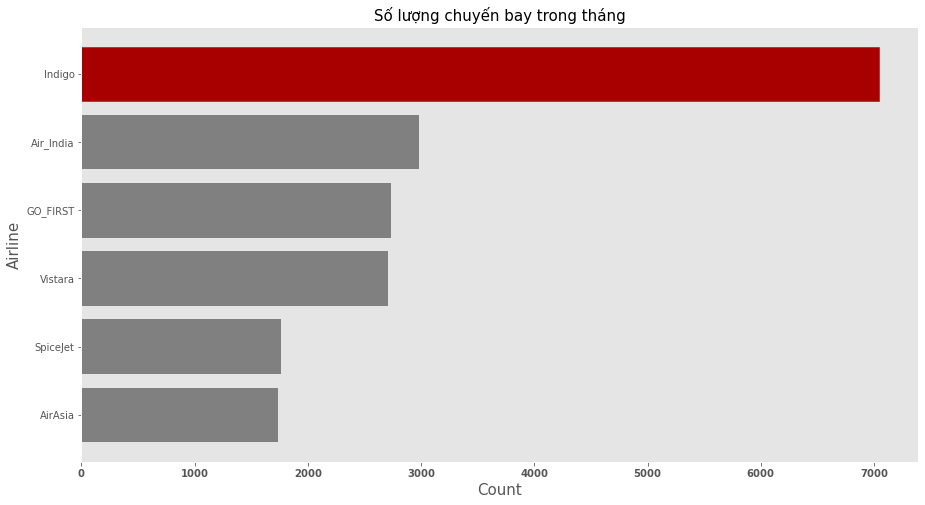

In [68]:
plt.figure(figsize = (15,8))
a = plt.barh(y= bar3['flight'],width = bar3['count'],color = '#808080')
a[-1].set_color("#A80000")
plt.title("Số lượng chuyến bay trong tháng",fontsize = 15)
plt.xlabel("Count",fontsize = 15)
plt.ylabel("Airline", fontsize = 15)
plt.xticks(weight='bold')
plt.grid(visible=False)

* Dù cho hãng Vistara có nhiều vé bán ra và có giá cao nhất nhưng hãng Indigo mới có nhiều chuyến bay nhất
* Số lượng chuyến bay của hãng Indigo gấp đôi các hãng còn lại trong tháng 3

## Giá vé của mỗi hãng

In [69]:
airline_class_grp = pd.DataFrame(data.groupby(by = ['airline','class']).agg('mean')['price'])
airline_class_grp

price
airline   class                 
AirAsia   Economy    4091.072742
Air_India Business  47131.039212
          Economy    7313.682169
GO_FIRST  Economy    5652.007595
Indigo    Economy    5324.216303
SpiceJet  Economy    6179.278881
Vistara   Business  55477.027777
          Economy    7806.943645

* Sự xuất hiện của hạng `thương gia` tùy vào hãng máy bay
    * Các hãng có hạng thương gia: Air_India, Vistara
    * Các hãng không có hạng thương gia: AirAsia, GO_FIRST, Indigo, SpiceJet


In [70]:
airline_eco_price_df = airline_class_grp.reset_index()[airline_class_grp.reset_index()['class'] == 'Economy']
airline_eco_price_df.sort_values(by = 'price',ascending=True,inplace=True)

In [71]:
airline_busi_price_df = airline_class_grp.reset_index()[airline_class_grp.reset_index()['class'] == 'Business']
airline_busi_price_df.sort_values(by = 'price',ascending=True,inplace=True)

In [72]:
airline_busi_price_df

,airline,class,price
1,Air_India,Business,47131.039212
6,Vistara,Business,55477.027777


In [73]:
airline_eco_price_df

,airline,class,price
0,AirAsia,Economy,4091.072742
4,Indigo,Economy,5324.216303
3,GO_FIRST,Economy,5652.007595
5,SpiceJet,Economy,6179.278881
2,Air_India,Economy,7313.682169
7,Vistara,Economy,7806.943645


In [74]:
fig_airline_price_eco = px.bar(airline_eco_price_df,x='price',y='airline',orientation='h',title = "Giá vé của các hãng hạng phổ thông")
fig_airline_price_eco.update_layout(
    width = 520,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    yaxis_title = None,
    title_x=0.5
)
fig_airline_price_eco.show()

In [75]:
fig_airline_price_busi = px.bar(airline_busi_price_df,x='price',y='airline',orientation='h',title = "Giá vé của các hãng hạng thương gia")
fig_airline_price_busi.update_layout(
    width = 520,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    yaxis_title = None,
    title_x=0.5

)
fig_airline_price_busi.show()

C:\Users\minhv\AppData\Local\Temp\ipykernel_1620\3399354071.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



Text(0.5, 0, 'Airline')

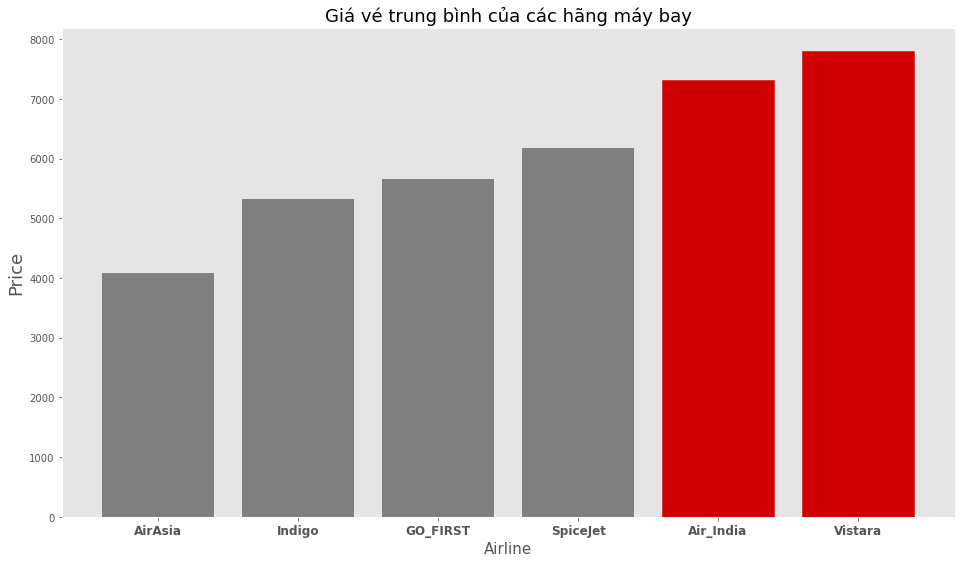

In [76]:
fig, ax = plt.subplots(figsize = (16,9))
ax.set_title(label = "Giá vé trung bình của các hãng máy bay",fontsize  = 18)
barlist = ax.bar(airline_eco_price_df['airline'],airline_eco_price_df['price'],color = '#808080')
barlist[-1].set_color('#D00000')
barlist[-2].set_color('#D00000')
ax.set_xticklabels(airline_eco_price_df['airline'], rotation=0,weight='bold', size=12)

plt.ylabel('Price',fontsize = 18)
plt.grid(visible=None)
plt.xlabel("Airline",fontsize = 15)

C:\Users\minhv\AppData\Local\Temp\ipykernel_1620\1681735197.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\minhv\AppData\Local\Temp\ipykernel_1620\1681735197.py:7: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



Text(0.5, 0, 'Airline')

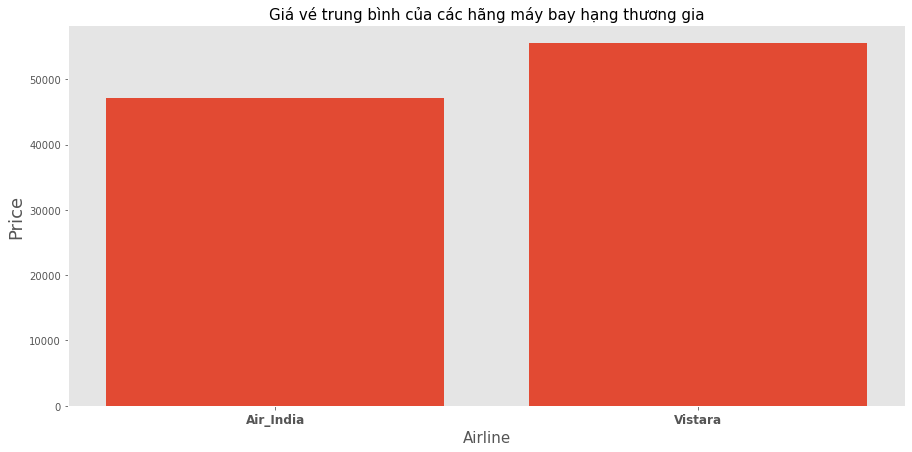

In [77]:
fig, ax = plt.subplots(figsize = (15,7))
ax.set_title(label = "Giá vé trung bình của các hãng máy bay hạng thương gia",fontsize  = 15)
barlist = ax.bar(airline_busi_price_df['airline'],airline_busi_price_df['price'])
ax.set_xticklabels(airline_busi_price_df['airline'], rotation=0,weight='bold', size=12)

plt.ylabel('Price',fontsize = 18)
plt.grid(b=None)
plt.xlabel("Airline",fontsize = 15)

* => Hãng máy bay có hạng thương gia có giá cao hơn các hãng khác
* Hãng có giá vé cao nhất là `Vistara`
* Hãng có giá vé thấp nhất là `AirAsia` 

## Thời gian xuất phát của mỗi hãng

In [78]:
grp_depart = grp_depart[grp_depart['depart_day'].dt.month==3]

In [79]:
grp_depart

,flight,depart_day,dep_time,count,month
0,Indigo,2022-03-20,Afternoon,1,3
1,Indigo,2022-03-21,Afternoon,1,3
2,Indigo,2022-03-24,Afternoon,1,3
3,Indigo,2022-03-25,Afternoon,1,3
4,Indigo,2022-03-28,Afternoon,1,3
...,...,...,...,...,...
58486,Vistara,2022-03-24,Evening,1,3
58487,Vistara,2022-03-26,Evening,1,3
58488,Vistara,2022-03-27,Evening,1,3
58489,Vistara,2022-03-28,Evening,1,3


In [80]:
count_airline_depart = pd.DataFrame(grp_depart.groupby(by=['flight','dep_time']).agg('count')['count']).reset_index().rename(columns={"flight":"airline"})
count_airline_depart 

,airline,dep_time,count
0,AirAsia,Afternoon,484
1,AirAsia,Early_Morning,282
2,AirAsia,Evening,283
3,AirAsia,Late_Night,207
4,AirAsia,Morning,206
5,AirAsia,Night,272
6,Air_India,Afternoon,799
7,Air_India,Early_Morning,647
8,Air_India,Evening,552
9,Air_India,Late_Night,184


In [81]:
idx_to_session = {0:"Early_Morning",1:"Morning",2:"Afternoon",3:"Evening",4:"Night",5:"Late_Night"}
session_to_idx = {}
for k,v in idx_to_session.items():
    session_to_idx[v] = k
session_to_idx

{'Early_Morning': 0,
 'Morning': 1,
 'Afternoon': 2,
 'Evening': 3,
 'Night': 4,
 'Late_Night': 5}

In [82]:
count_airline_depart['dep_time'] = count_airline_depart['dep_time'].apply(lambda x: session_to_idx[x])
count_airline_depart

,airline,dep_time,count
0,AirAsia,2,484
1,AirAsia,0,282
2,AirAsia,3,283
3,AirAsia,5,207
4,AirAsia,1,206
5,AirAsia,4,272
6,Air_India,2,799
7,Air_India,0,647
8,Air_India,3,552
9,Air_India,5,184


In [83]:
count_airline_depart = count_airline_depart.sort_values(by = ['airline','dep_time'])
count_airline_depart['dep_time'] = count_airline_depart['dep_time'].apply(lambda x: idx_to_session[x])

In [84]:
# count_airline_depart['count'] = count_airline_depart['count']/50
# count_airline_depart['count'] = count_airline_depart['count'].astype(int)

Text(0.5, 0, 'Airline')

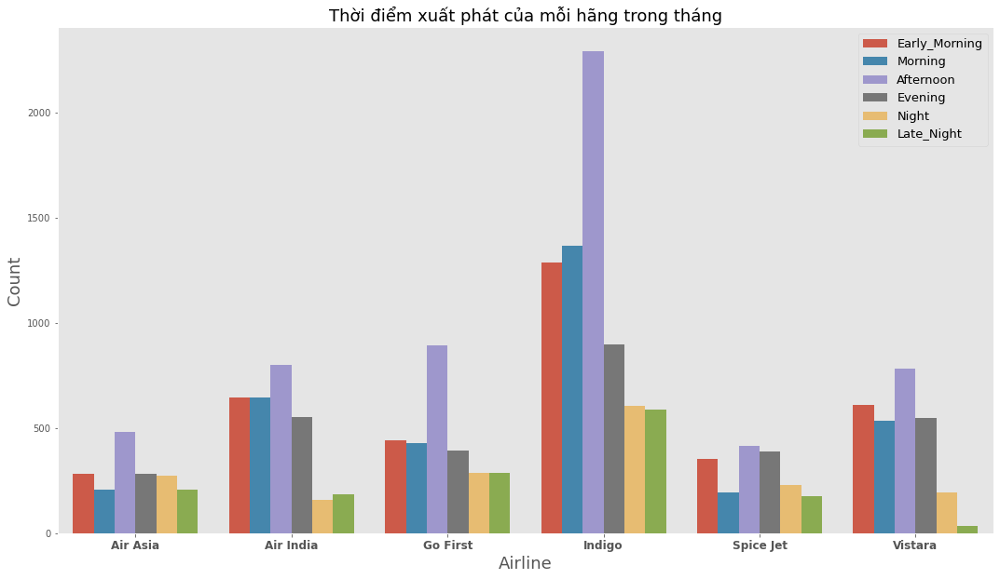

In [85]:
plt.figure(figsize=(18,10))
ax = sns.barplot(data = count_airline_depart,x = 'airline',y = 'count',hue = 'dep_time')
ax.set_xticklabels(['Air Asia','Air India', 'Go First','Indigo','Spice Jet',"Vistara"], rotation=0,weight='bold', size=12)
ax.legend(fontsize = 13)
plt.title("Thời điểm xuất phát của mỗi hãng trong tháng",fontsize = 18)

plt.ylabel('Count',fontsize = 18)
plt.grid(visible=0)
plt.xlabel("Airline",fontsize = 18)

* Số chuyến bay vào buổi chiều cao nhất
* Số chuyến bay vào buổi tối thấp nhất      

## Bay vào buổi nào và so giá vé


### Khởi hành

In [86]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [87]:
depart_price_eco = pd.DataFrame(economy.groupby(by='dep_time').agg('mean')['price']).reset_index()
depart_price_eco = depart_price_eco.sort_values(by='price',ascending=True)
depart_price_eco

,dep_time,price
5,Night,5657.726264
3,Late_Night,5839.755453
2,Evening,6445.988858
0,Afternoon,6513.475753
1,Early_Morning,6654.596329
4,Morning,7266.185710


In [88]:
depart_price_busi = pd.DataFrame(business.groupby(by='dep_time').agg('mean')['price']).reset_index()
depart_price_busi = depart_price_busi.sort_values(by='price',ascending=True)
depart_price_busi

,dep_time,price
3,Late_Night,50379.563612
5,Night,51507.325168
0,Afternoon,51834.138586
1,Early_Morning,52266.574139
2,Evening,52859.720495
4,Morning,54038.271046


In [89]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


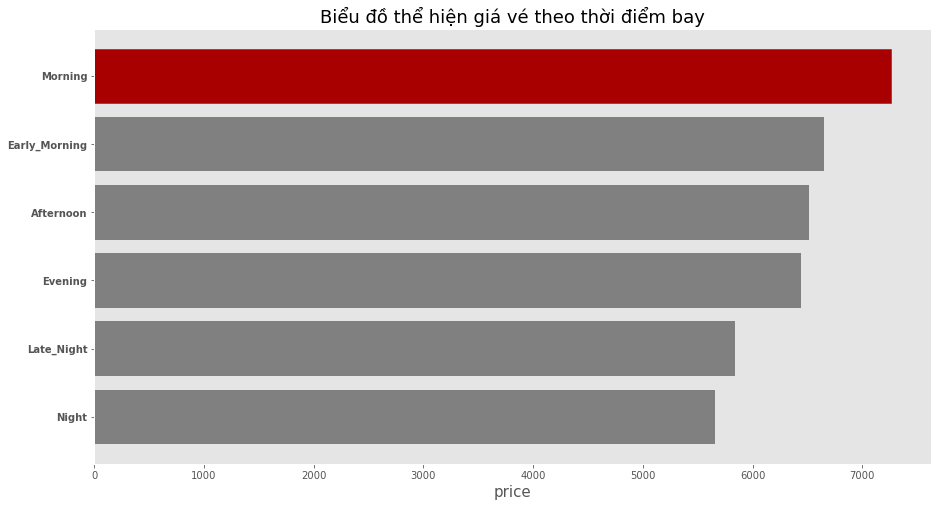

In [90]:
plt.figure(figsize = (15,8))
barlist = plt.barh(depart_price_eco['dep_time'],depart_price_eco['price'],color = "#808080")
barlist[-1].set_color("#A80000")
plt.yticks(weight = 'bold')
plt.title("Biểu đồ thể hiện giá vé theo thời điểm bay",fontsize = 18)
plt.xlabel("price",fontsize = 15)
plt.grid(visible=0)

Text(0.5, 0, 'price')

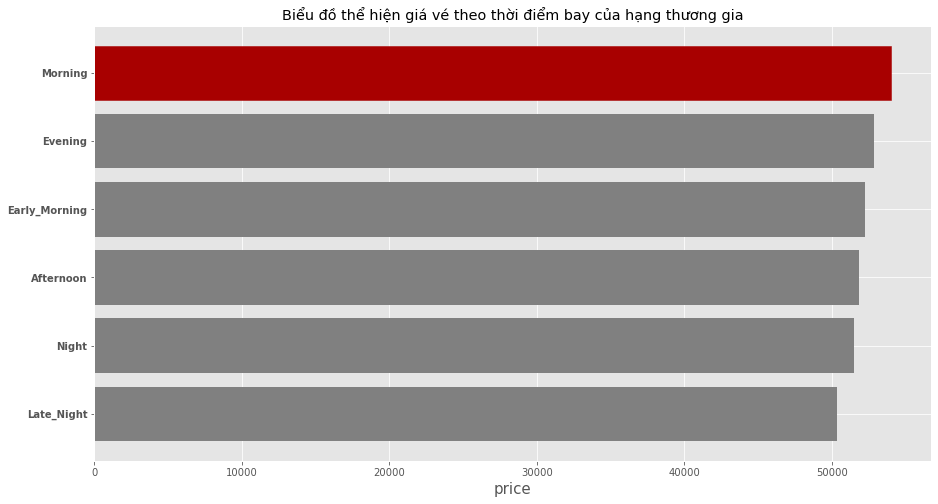

In [91]:
plt.figure(figsize = (15,8))
barlist = plt.barh(depart_price_busi['dep_time'],depart_price_busi['price'],color = "#808080")
barlist[-1].set_color("#A80000")
plt.yticks(weight = 'bold')
plt.title("Biểu đồ thể hiện giá vé theo thời điểm bay của hạng thương gia")
plt.xlabel("price",fontsize = 15)

* Các chuyến bay vào buổi sáng đối với 2 hạng phổ thông và thương gia đều có giá cao nhất
* Các chuyến bay vào buổi khác: Có sự khác biệt 

## Phân phối giá đối với từng hạng máy bay 


C:\Users\minhv\AppData\Local\Temp\ipykernel_1620\921364221.py:3: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



Text(0, 0.5, 'frequency')

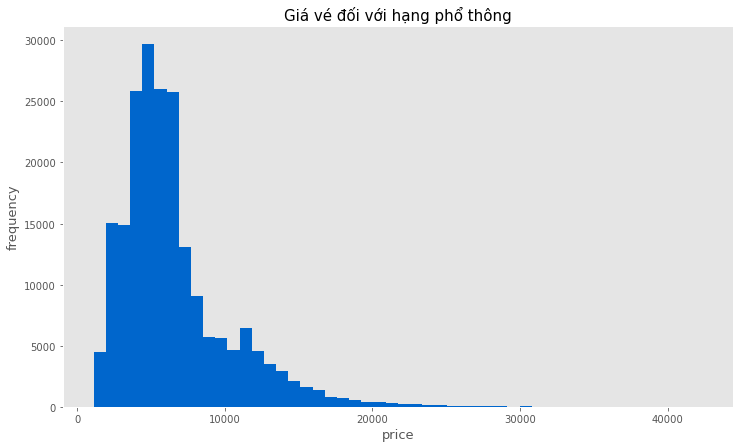

In [92]:
plt.figure(figsize = (12,7))
data[data['class'] == 'Economy']['price'].hist(bins = 50,color = '#0066CC')
plt.grid(b=0)
plt.title("Giá vé đối với hạng phổ thông", fontsize = 15)
plt.xlabel("price",fontsize = 13) 
plt.ylabel("frequency",fontsize = 13)

* => Giá vé hạng phổ thông chủ yếu tập trung trong khoảng 3000-8000

C:\Users\minhv\AppData\Local\Temp\ipykernel_1620\3236024933.py:3: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



Text(0, 0.5, 'frequency')

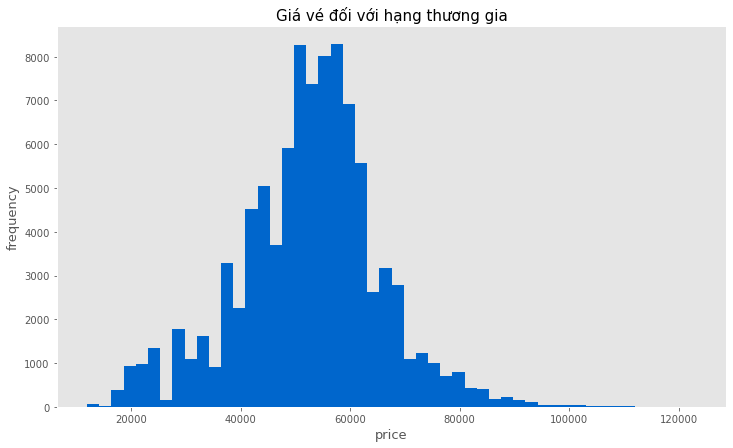

In [93]:
plt.figure(figsize = (12,7))
data[data['class'] == 'Business']['price'].hist(bins = 50,color = '#0066CC')
plt.grid(b=0)
plt.title("Giá vé đối với hạng thương gia", fontsize = 15)
plt.xlabel("price",fontsize = 13) 
plt.ylabel("frequency",fontsize = 13)

* Giá vé hạng thương gia chủ yếu tập trung trong khoảng 50000-63000

(array([0, 1]), [Text(0, 0, 'Economy'), Text(0, 1, 'Business')])

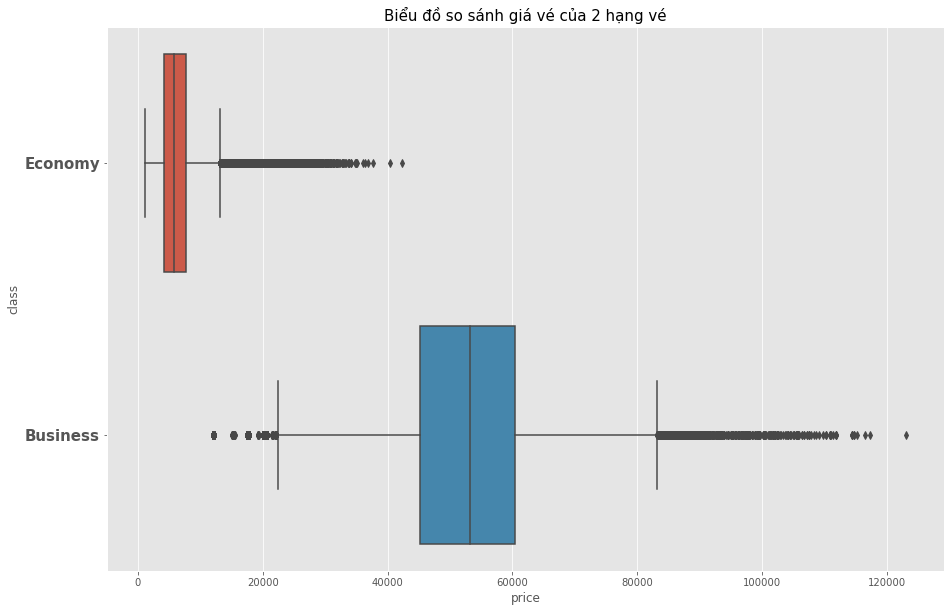

In [94]:
plt.figure(figsize = (15,10))
plt.title("Biểu đồ so sánh giá vé của 2 hạng vé",fontsize = 15)
sns.boxplot(data = data,x='price',y = 'class')
plt.yticks(weight = 'bold',fontsize = 15)

* => Các outlier kia có thể là do `điểm dừng`, `days_left`

## Khởi đầu và kết thúc ở đâu là nhiều

In [95]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [96]:
dp = concate.groupby(by=['depart_day','flight','from','dep_time']).agg('count').reset_index()
dp['price'] = 1
count_dp = pd.DataFrame(dp.groupby(by='from').agg('count')['price']).reset_index().rename(columns={'price':'count'}).sort_values(by='count',ascending=0)
count_dp

,from,count
2,Delhi,14735
5,Mumbai,11169
0,Bangalore,10131
4,Kolkata,8323
3,Hyderabad,8089
1,Chennai,6251


In [97]:
c = []
for i in range(6):
    if i == 0:
        c.append("#FF3333")
    else:
        c.append('grey')

Text(0.5, 0, 'City')

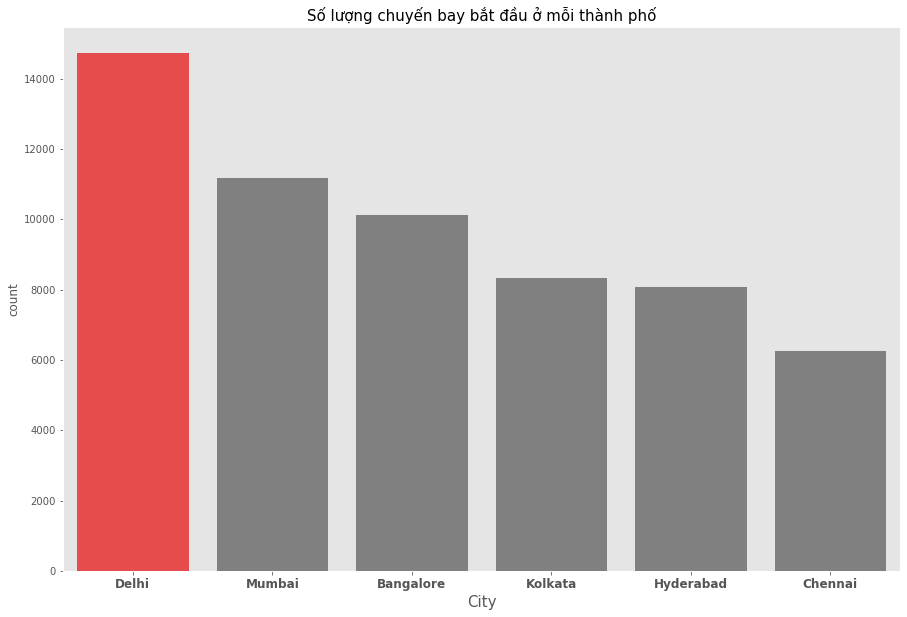

In [98]:
plt.figure(figsize = (15,10))
ax = sns.barplot(data=count_dp,x='from',y='count',palette=c)
ax.set_xticklabels(count_dp['from'].value_counts().index, rotation=0,weight='bold', size=12)
plt.grid(visible=0)
plt.title("Số lượng chuyến bay bắt đầu ở mỗi thành phố",fontsize = 15)
plt.xlabel("City",fontsize = 15)


In [99]:
ar = concate.groupby(by=['depart_day','flight','to','dep_time']).agg('count').reset_index()
ar['price'] = 1
count_ar = pd.DataFrame(ar.groupby(by='to').agg('count')['price']).reset_index().rename(columns={'price':'count'}).sort_values(by='count',ascending=0)
count_ar

,to,count
4,Kolkata,23627
2,Delhi,23582
5,Mumbai,22529
0,Bangalore,21537
3,Hyderabad,18795
1,Chennai,18582


Text(0.5, 0, 'City')

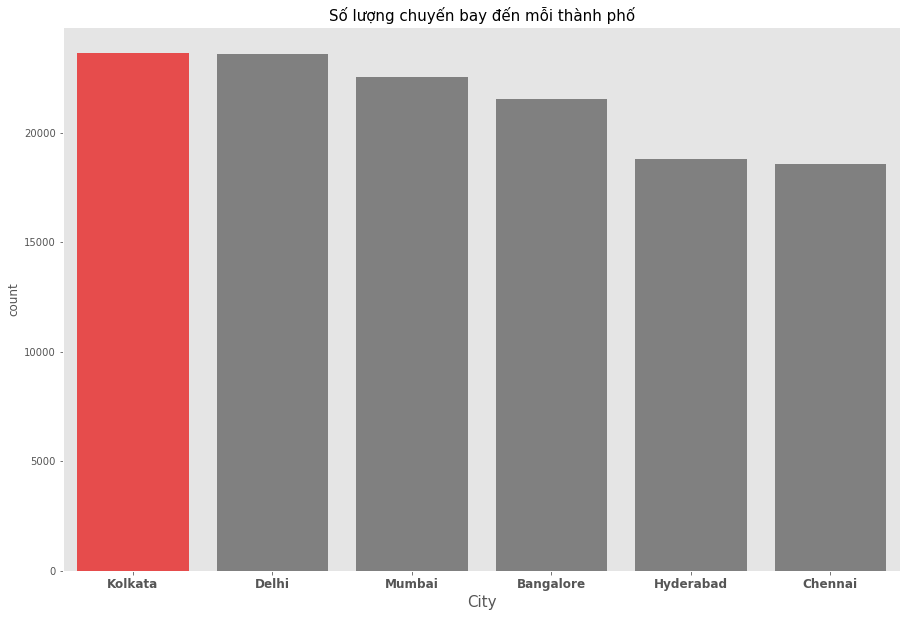

In [100]:
plt.figure(figsize = (15,10))
ax = sns.barplot(data=count_ar,x='to',y='count',palette=c)
ax.set_xticklabels(count_ar['to'].value_counts().index, rotation=0,weight='bold', size=12)

plt.grid(visible=0)
plt.title("Số lượng chuyến bay đến mỗi thành phố",fontsize = 15)
plt.xlabel("City",fontsize = 15)


* => Thành phố có nhiều chuyến bay qua lại là : `Mumbai` và `Delhi`. Điều này cũng dễ hiểu vì `Mumbai` là thành phố sầm uất ở Ấn Độ và `Delhi` là thủ đô của Ấn độ

## Giá vé trung bình khi đến mỗi thành phố

In [101]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [102]:
depart_desti_df = pd.DataFrame(data.groupby(by=['source_city','destination_city','class']).agg('mean')[['price','duration']]).reset_index()
depart_desti_df

,source_city,destination_city,class,price,duration
0,Bangalore,Chennai,Business,52436.915395,15.594863
1,Bangalore,Chennai,Economy,7105.953850,13.859390
2,Bangalore,Delhi,Business,48144.337108,10.831059
3,Bangalore,Delhi,Economy,6124.897982,9.379209
4,Bangalore,Hyderabad,Business,50395.796948,16.210345
5,Bangalore,Hyderabad,Economy,6360.141698,13.118739
6,Bangalore,Kolkata,Business,58854.693091,16.257988
7,Bangalore,Kolkata,Economy,7375.638594,11.658468
8,Bangalore,Mumbai,Business,58024.618208,12.205577
9,Bangalore,Mumbai,Economy,6381.093332,10.280925


In [103]:
te = depart_desti_df[depart_desti_df['source_city'] == 'Mumbai'].sort_values(by='price')
te

,source_city,destination_city,class,price,duration
57,Mumbai,Hyderabad,Economy,5774.891130,13.146209
55,Mumbai,Delhi,Economy,5889.281400,8.966908
53,Mumbai,Chennai,Economy,6420.917984,12.065689
51,Mumbai,Bangalore,Economy,6432.511946,11.247169
59,Mumbai,Kolkata,Economy,7227.971735,12.324644
54,Mumbai,Delhi,Business,43846.329273,11.483814
56,Mumbai,Hyderabad,Business,51593.643678,13.498523
52,Mumbai,Chennai,Business,55703.326197,13.873640
58,Mumbai,Kolkata,Business,57106.526385,14.010849
50,Mumbai,Bangalore,Business,57970.544389,12.372113


In [104]:
te = depart_desti_df[depart_desti_df['source_city'] == 'Mumbai'].sort_values(by='price')
te
fig_country = px.bar(te,x='price',y='destination_city',title = "Giá vé theo từng điểm khởi hành và kết thúc")
fig_country.update_layout(
    width = 650,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    title_x=0.5
)

fig_country.show()

## Giá vé của từng hạng vé theo thời gian bay trung bình

In [105]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [106]:
economy

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,2022-02-11,SpiceJet,SG,8709,Evening,Delhi,2.17,non-stop,Night,Mumbai,5953
1,2022-02-11,SpiceJet,SG,8157,Early_Morning,Delhi,2.33,non-stop,Early_Morning,Mumbai,5953
2,2022-02-11,AirAsia,I5,764,Late_Night,Delhi,2.17,non-stop,Early_Morning,Mumbai,5956
3,2022-02-11,Vistara,UK,995,Morning,Delhi,2.25,non-stop,Afternoon,Mumbai,5955
4,2022-02-11,Vistara,UK,963,Early_Morning,Delhi,2.33,non-stop,Morning,Mumbai,5955
...,...,...,...,...,...,...,...,...,...,...,...
206769,2022-03-31,Vistara,UK,832,Early_Morning,Chennai,13.83,1-stop,Evening,Hyderabad,7697
206770,2022-03-31,Vistara,UK,832,Early_Morning,Chennai,13.83,1-stop,Evening,Hyderabad,7709
206771,2022-03-31,Vistara,UK,826,Afternoon,Chennai,20.58,1-stop,Morning,Hyderabad,8640
206772,2022-03-31,Vistara,UK,822,Morning,Chennai,23.33,1-stop,Morning,Hyderabad,8640


Text(0.5, 1.0, 'Biểu đồ so sánh thời gian bay của 2 hạng vé')

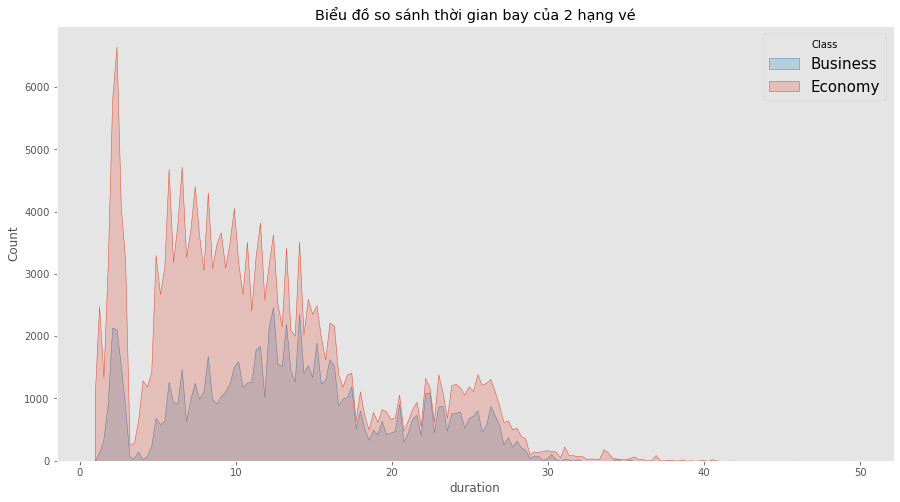

In [107]:
plt.figure(figsize=(15,8))
sns.histplot(data = data, x = 'duration',hue = "class",element="poly",legend= False)

plt.grid(visible=0)
plt.legend(loc = 'upper right',labels = ['Business',"Economy"],title = "Class",fontsize = 15)
plt.title("Biểu đồ so sánh thời gian bay của 2 hạng vé")

* => Không có sự khác biệt giữa thời gian bay của 2 hạng vé

Text(0, 0.5, 'Price')

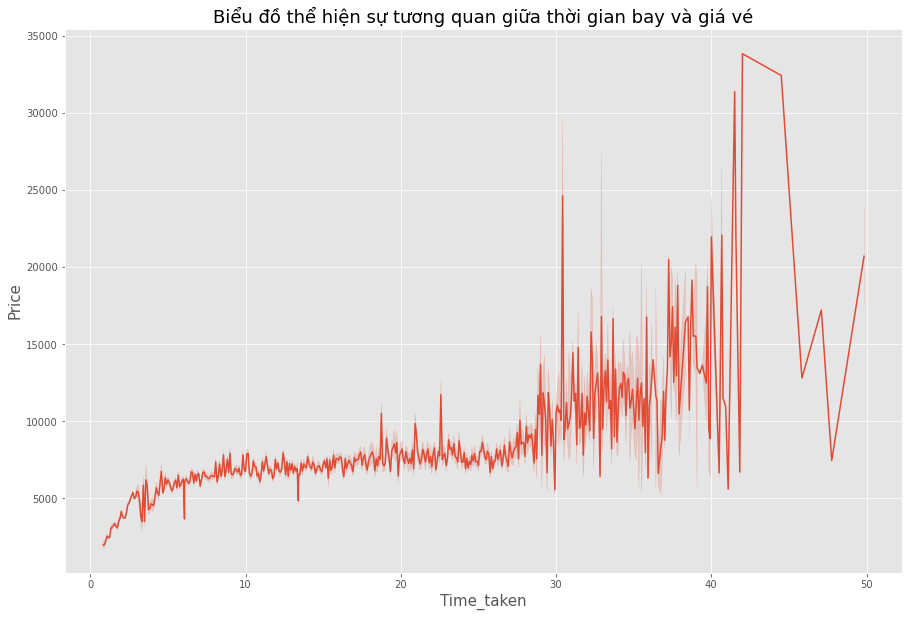

In [108]:
plt.figure(figsize = (15,10))
plt.title("Biểu đồ thể hiện sự tương quan giữa thời gian bay và giá vé",fontsize = 18)
sns.lineplot(data = economy,x='time_taken',y='price')

plt.xlabel("Time_taken",fontsize = 15)
plt.ylabel("Price",fontsize = 15)


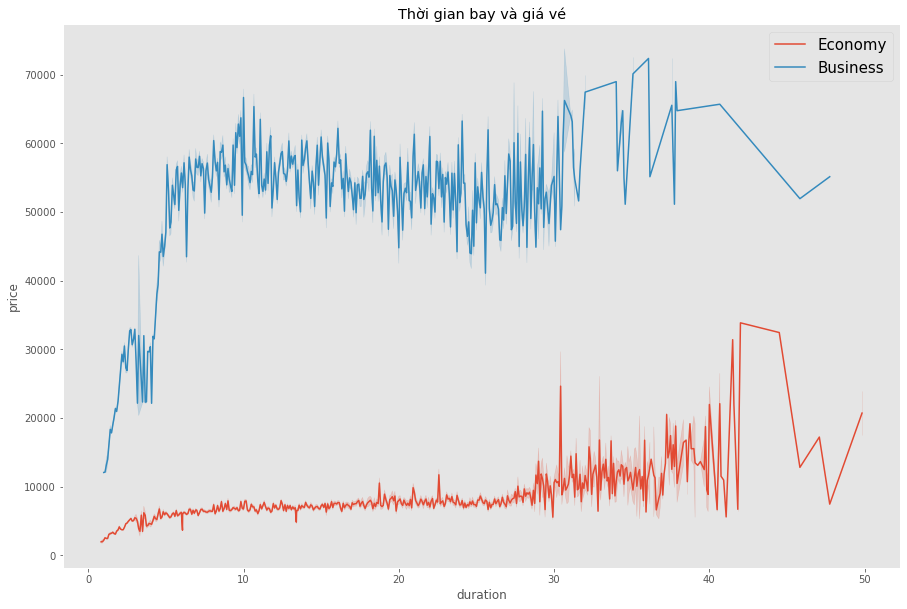

In [109]:
plt.figure(figsize = (15,10))
plt.title("Thời gian bay và giá vé")
sns.lineplot(data = data,x='duration',y='price',hue='class')
plt.grid(visible=0)
plt.legend(loc = 'upper right',fontsize = 15)

* Thời gian bay càng dài thì giá vé tăng

## Số lượng điểm dừng


In [110]:
data['stops'].value_counts()

one            250863
zero            36004
two_or_more     13286
Name: stops, dtype: int64

Text(0, 0.5, 'Count')

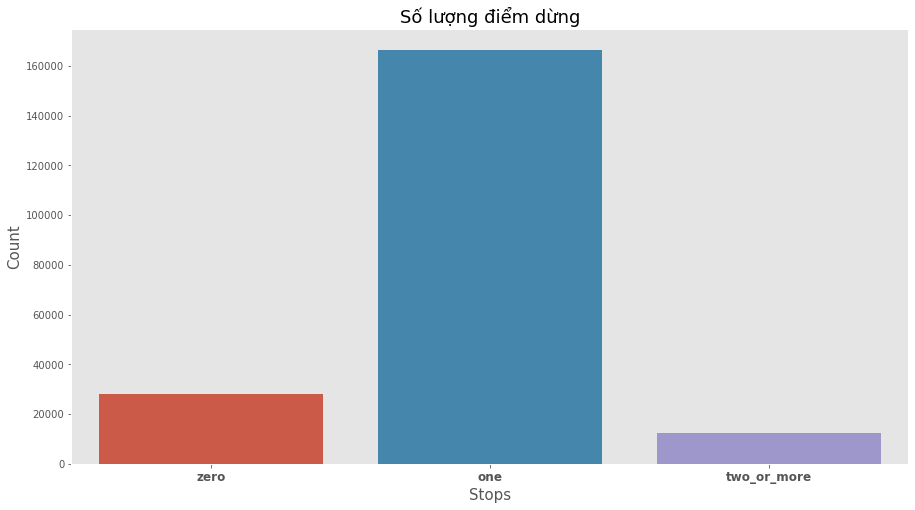

In [111]:
plt.figure(figsize = (15,8))
ax = sns.countplot(data = data[data['class']=='Economy'],x = "stops")
ax.set_xticklabels(["zero","one","two_or_more"], rotation=0,weight='bold', size=12)
plt.title("Số lượng điểm dừng",fontsize = 18)
plt.grid(visible=0)
plt.xlabel("Stops",fontsize = 15)
plt.ylabel("Count",fontsize = 15)


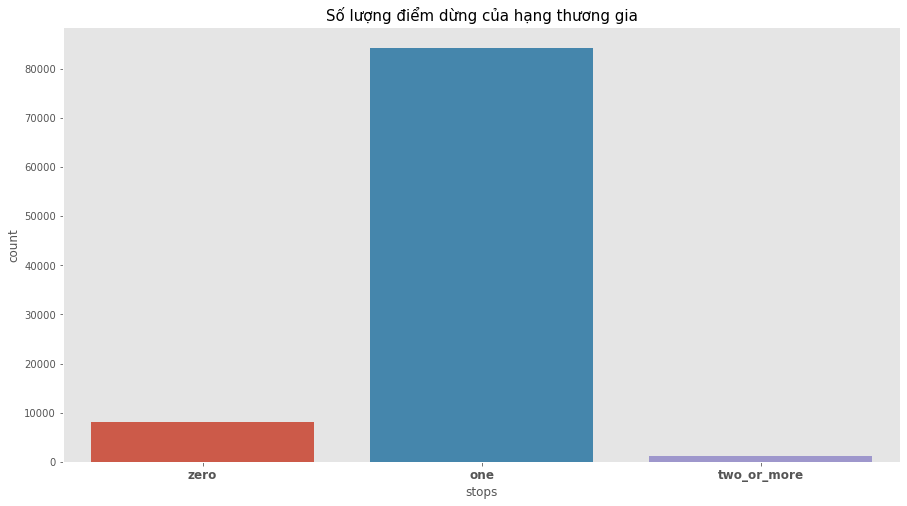

In [112]:
plt.figure(figsize = (15,8))
ax = sns.countplot(data = data[data['class']=='Business'],x = "stops")
ax.set_xticklabels(["zero","one","two_or_more"], rotation=0,weight='bold', size=12)
plt.title("Số lượng điểm dừng của hạng thương gia",fontsize = 15)
plt.grid(visible=0)

* => Các chuyến bay có 1 điểm dừng chiếm đa số 

## Số lượng điểm dừng so với giá vé

In [113]:
stop_price_eco = pd.DataFrame(data[data['class']=='Economy'].groupby('stops').agg('mean')['price']).reset_index()
stop_price_eco = stop_price_eco.sort_values(by='price')
stop_price_eco

,stops,price
2,zero,4012.624615
0,one,6812.857800
1,two_or_more,9142.264279


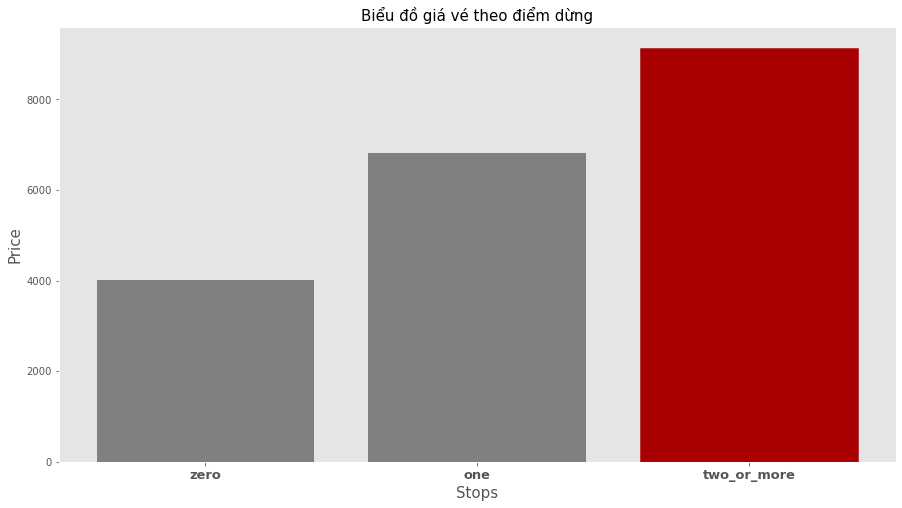

In [114]:
plt.figure(figsize = (15,8))
ax = plt.bar(x =stop_price_eco['stops'], height= stop_price_eco['price'],color = "#808080")
plt.xticks(weight = 'bold',fontsize = 13)
plt.xlabel("Stops",fontsize = 15)
plt.ylabel("Price",fontsize = 15)
ax[-1].set_color("#A80000")
plt.title("Biểu đồ giá vé theo điểm dừng",fontsize = 15)
plt.grid(visible=0)

In [115]:
stop_price_bs = pd.DataFrame(data[data['class']=='Business'].groupby('stops').agg('mean')['price']).reset_index()
stop_price_bs = stop_price_bs.sort_values(by='price')
stop_price_bs

,stops,price
2,zero,27846.339052
0,one,54687.377156
1,two_or_more,70127.660203


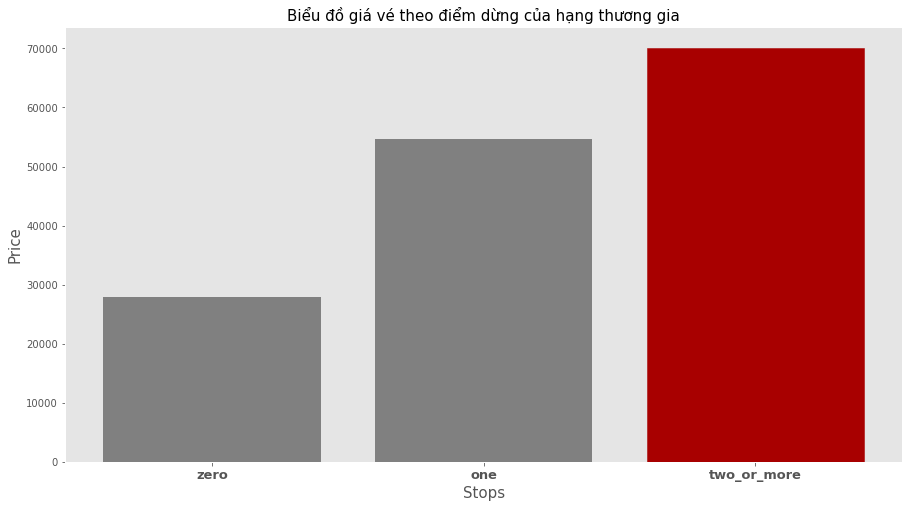

In [116]:
plt.figure(figsize = (15,8))
ax = plt.bar(x =stop_price_bs['stops'], height= stop_price_bs['price'],color = "#808080")
plt.xticks(weight = 'bold',fontsize = 13)
plt.xlabel("Stops",fontsize = 15)
plt.ylabel("Price",fontsize = 15)
ax[-1].set_color("#A80000")
plt.title("Biểu đồ giá vé theo điểm dừng của hạng thương gia",fontsize = 15)
plt.grid(visible=0)

* => Các chuyến bay có 2 điểm dừng có giá cao hơn hẳn dù cho 1 điểm dừng chiếm đa số

## Giá vé ảnh hưởng thế nào đối với các vé mua cách 1-2 ngày (day left) ở 2 hạng vé

In [117]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [118]:
data[(data['class']=='Economy')]

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
206661,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7697
206662,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Economy,13.83,49,7709
206663,Vistara,UK-826,Chennai,Afternoon,one,Morning,Hyderabad,Economy,20.58,49,8640
206664,Vistara,UK-822,Chennai,Morning,one,Morning,Hyderabad,Economy,23.33,49,8640


In [119]:
days_left_grp_eco = pd.DataFrame(data[(data['class']=='Economy')].groupby(by = 'days_left').agg('mean')['price']).reset_index()
days_left_grp_eco.head(10)

,days_left,price
0,1,14613.179410
1,2,13980.828244
2,3,13174.050992
3,4,10901.386284
4,5,10605.918315
5,6,10319.679864
6,7,10471.873164
7,8,10479.491889
8,9,11352.916150
9,10,11187.502450


Text(0, 0.5, 'Price')

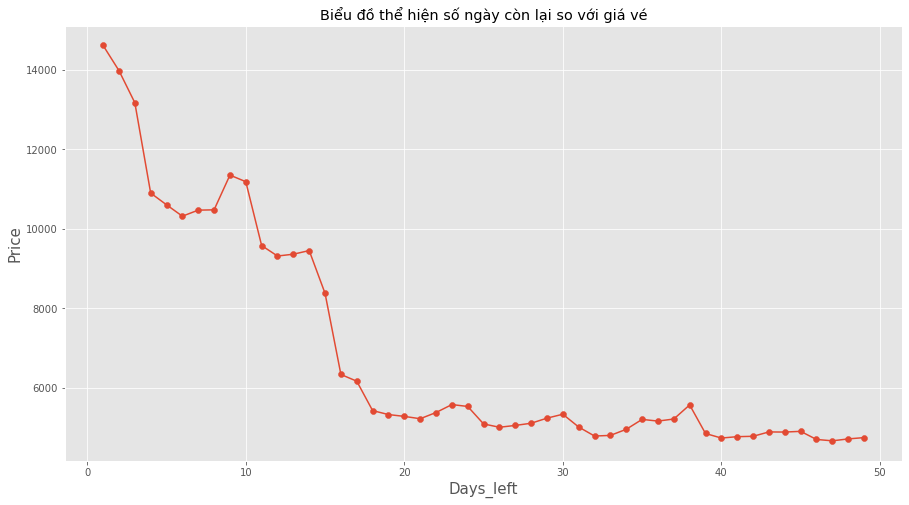

In [120]:
plt.figure(figsize = (15,8))
plt.title("Biểu đồ thể hiện số ngày còn lại so với giá vé")
sns.lineplot(data = days_left_grp_eco,x='days_left',y='price')
plt.scatter(days_left_grp_eco['days_left'],days_left_grp_eco['price'])
plt.grid(visible=True)
plt.xlabel("Days_left",fontsize=15)
plt.ylabel("Price",fontsize = 15)

In [121]:
fig_daysleft_eco = px.line(days_left_grp_eco,x='days_left',y='price',title = "Giá vé theo số ngày còn lại")
fig_daysleft_eco.update_layout(
    width = 620,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    title_x=0.5
)
fig_daysleft_eco.show()

In [122]:
days_left_grp_busi = pd.DataFrame(data[(data['class']=='Business')].groupby(by = 'days_left').agg('mean')['price']).reset_index()
days_left_grp_busi.head(10)

,days_left,price
0,1,65169.312030
1,2,60455.848506
2,3,60313.822331
3,4,56120.287087
4,5,56149.915397
5,6,53643.310488
6,7,54501.171604
7,8,53224.650386
8,9,52981.195297
9,10,54247.303856


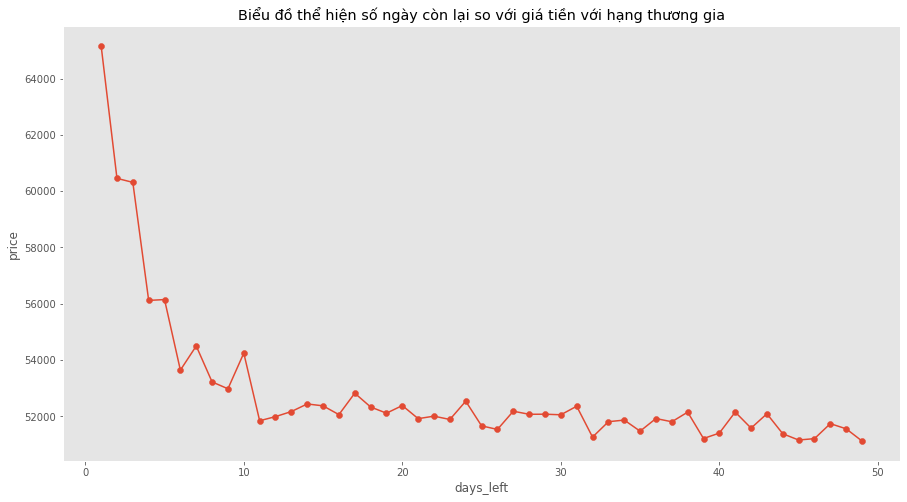

In [123]:
plt.figure(figsize = (15,8))
plt.title("Biểu đồ thể hiện số ngày còn lại so với giá tiền với hạng thương gia")
sns.lineplot(data = days_left_grp_busi,x='days_left',y='price')
plt.scatter(days_left_grp_busi['days_left'],days_left_grp_busi['price'])
plt.grid(visible=False)

In [124]:
fig_daysleft_busi = px.line(days_left_grp_busi,x='days_left',y='price',title = "Giá vé theo số ngày còn lại")
fig_daysleft_busi.update_layout(
    width = 620,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    title_x=0.5
)
fig_daysleft_busi.show()

* Mua vé càng sớm thì giá vé sẽ càng rẻ và ngược lại 
* Mua vé trước 1 ngày thì giá vé sẽ cao nhất

##  Giá vé và số vé bán ra theo từng ngày

In [125]:
economy['month'] = economy['date'].dt.month
economy['day'] = economy['date'].dt.day

In [126]:
business['month'] = business['date'].dt.month
business['day'] = business['date'].dt.day

### Số vé bán ra theo từng ngày

In [127]:
md_price_count_eco = pd.DataFrame(economy.groupby(by = ['month','day']).agg('count')['price']).reset_index()
md_price_count_eco = md_price_count_eco[md_price_count_eco['month']==3]
md_price_count_eco.head(5)

,month,day,price
18,3,1,4556
19,3,2,4512
20,3,3,4508
21,3,4,4515
22,3,5,4430


Text(0, 0.5, 'Price')

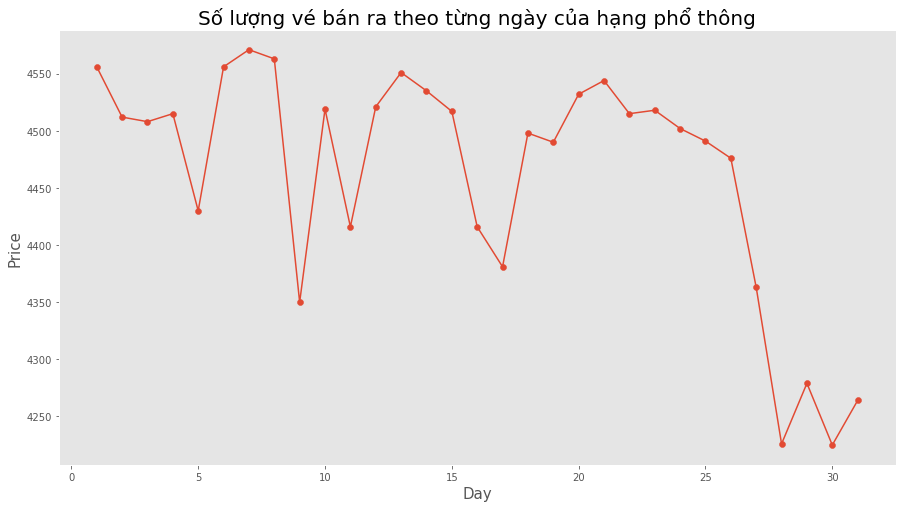

In [128]:
plt.figure(figsize = (15,8))
plt.title("Số lượng vé bán ra theo từng ngày của hạng phổ thông",fontsize = 20)
plt.plot(md_price_count_eco['day'],md_price_count_eco['price'])
plt.scatter(md_price_count_eco['day'],md_price_count_eco['price'])
plt.grid(visible=False)
plt.xlabel("Day",fontsize = 15)
plt.ylabel("Price",fontsize = 15)

In [129]:
md_price_count_busi = pd.DataFrame(business.groupby(by = ['month','day']).agg('count')['price']).reset_index()
md_price_count_busi = md_price_count_busi[md_price_count_busi['month']==3]
md_price_count_busi.head(5)

,month,day,price
18,3,1,1981
19,3,2,1990
20,3,3,1971
21,3,4,1979
22,3,5,1971


Text(0, 0.5, 'Price')

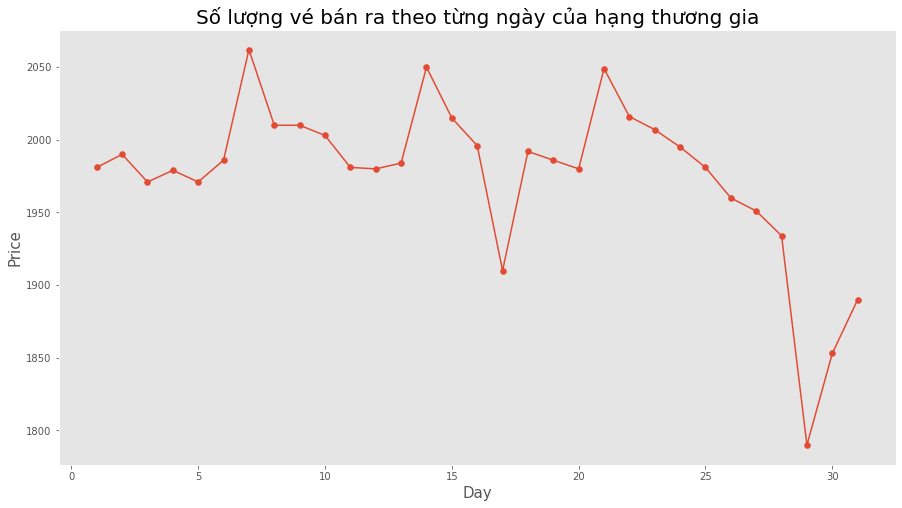

In [130]:
plt.figure(figsize = (15,8))
plt.title("Số lượng vé bán ra theo từng ngày của hạng thương gia",fontsize = 20)
plt.plot(md_price_count_busi['day'],md_price_count_busi['price'])
plt.scatter(md_price_count_busi['day'],md_price_count_busi['price'])
plt.grid(visible=False)
plt.xlabel("Day",fontsize = 15)
plt.ylabel("Price",fontsize = 15)

### Giá vé theo từng ngày 

In [131]:
md_price_eco = pd.DataFrame(economy.groupby(by = ['month','day']).agg('mean')['price']).reset_index()
md_price_eco = md_price_eco[md_price_eco['month']==3]
md_price_eco.head(5)

,month,day,price
18,3,1,5330.167910
19,3,2,5284.451684
20,3,3,5225.473381
21,3,4,5381.483499
22,3,5,5581.506998


Text(0, 0.5, 'Price')

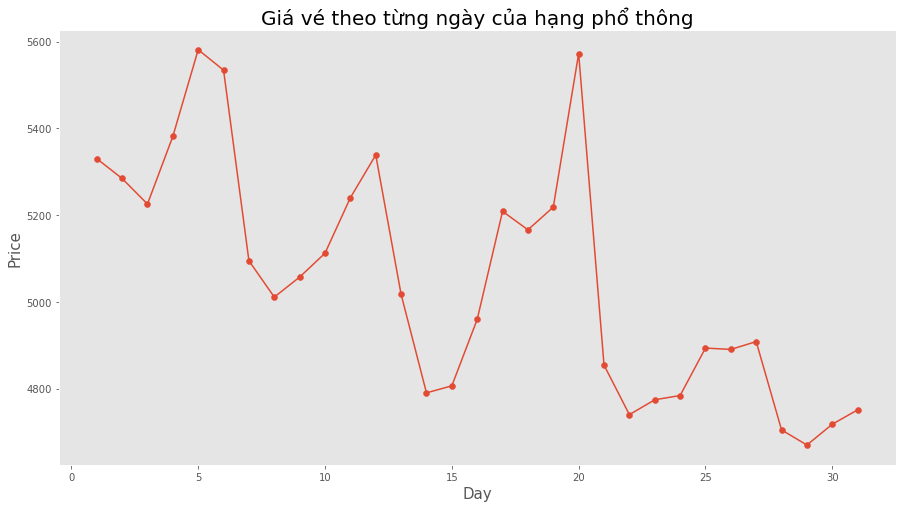

In [132]:
plt.figure(figsize = (15,8))
plt.title("Giá vé theo từng ngày của hạng phổ thông",fontsize = 20)
plt.plot(md_price_eco['day'],md_price_eco['price'])
plt.scatter(md_price_eco['day'],md_price_eco['price'])
plt.grid(visible=False)
plt.xlabel("Day",fontsize = 15)
plt.ylabel("Price",fontsize = 15)

In [133]:
md_price_busi = pd.DataFrame(business.groupby(by = ['month','day']).agg('mean')['price']).reset_index()
md_price_busi = md_price_busi[md_price_busi['month']==3]
md_price_busi.head(5)

,month,day,price
18,3,1,52113.802120
19,3,2,52384.847236
20,3,3,51919.704211
21,3,4,52008.284992
22,3,5,51890.213597


Text(0, 0.5, 'Price')

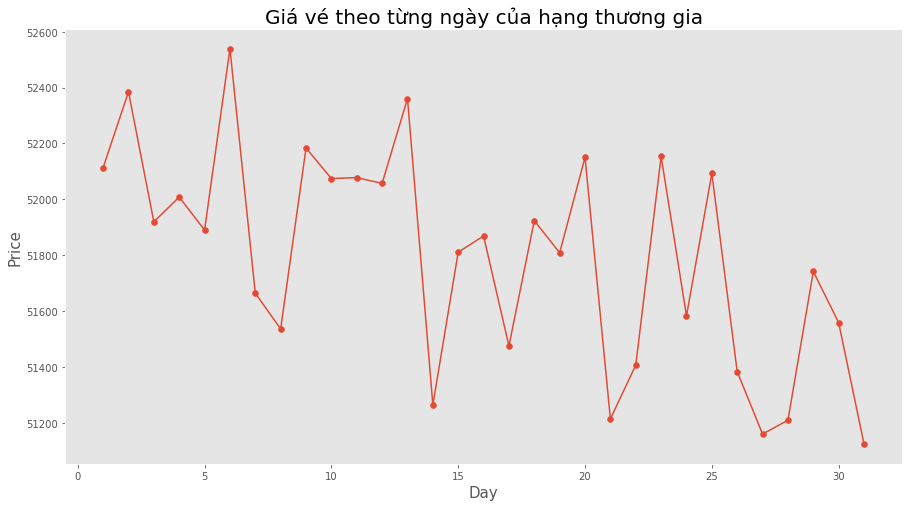

In [134]:
plt.figure(figsize = (15,8))
plt.title("Giá vé theo từng ngày của hạng thương gia",fontsize = 20)
plt.plot(md_price_busi['day'],md_price_busi['price'])
plt.scatter(md_price_busi['day'],md_price_busi['price'])
plt.grid(visible=False)
plt.xlabel("Day",fontsize = 15)
plt.ylabel("Price",fontsize = 15)

* Vào khoảng đầu và giữa tháng thì số vé bán được khá cao

In [135]:
eco_new

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,days_left,depart_day,flight
0,2022-02-11,SpiceJet,Evening,Delhi,2.17,non-stop,Night,Mumbai,5953,1,2022-02-12,SG-8709
1,2022-02-11,SpiceJet,Early_Morning,Delhi,2.33,non-stop,Early_Morning,Mumbai,5953,1,2022-02-12,SG-8157
2,2022-02-11,AirAsia,Late_Night,Delhi,2.17,non-stop,Early_Morning,Mumbai,5956,1,2022-02-12,I5-764
3,2022-02-11,Vistara,Morning,Delhi,2.25,non-stop,Afternoon,Mumbai,5955,1,2022-02-12,UK-995
4,2022-02-11,Vistara,Early_Morning,Delhi,2.33,non-stop,Morning,Mumbai,5955,1,2022-02-12,UK-963
...,...,...,...,...,...,...,...,...,...,...,...,...
206769,2022-03-31,Vistara,Early_Morning,Chennai,13.83,1-stop,Evening,Hyderabad,7697,2,2022-04-02,UK-832
206770,2022-03-31,Vistara,Early_Morning,Chennai,13.83,1-stop,Evening,Hyderabad,7709,2,2022-04-02,UK-832
206771,2022-03-31,Vistara,Afternoon,Chennai,20.58,1-stop,Morning,Hyderabad,8640,2,2022-04-02,UK-826
206772,2022-03-31,Vistara,Morning,Chennai,23.33,1-stop,Morning,Hyderabad,8640,2,2022-04-02,UK-822


Cùng chuyến bay nhưng thời gian bay khác nhau: máy bay hạ cánh tại nơi quá cảnh để lên chuyến bay khác

In [136]:
eco_new[(eco_new['flight'] == 'UK-822') & (eco_new['depart_day'] == '2022-02-23') & (eco_new['dep_time'] == 'Morning')]

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,days_left,depart_day,flight
181034,2022-02-16,Vistara,Morning,Chennai,4.75,1-stop,Afternoon,Delhi,11868,7,2022-02-23,UK-822
181035,2022-02-16,Vistara,Morning,Chennai,7.17,1-stop,Afternoon,Delhi,11868,7,2022-02-23,UK-822
181036,2022-02-16,Vistara,Morning,Chennai,8.33,1-stop,Evening,Delhi,11868,7,2022-02-23,UK-822
181038,2022-02-16,Vistara,Morning,Chennai,10.00,1-stop,Evening,Delhi,11868,7,2022-02-23,UK-822
181039,2022-02-16,Vistara,Morning,Chennai,10.92,1-stop,Evening,Delhi,11868,7,2022-02-23,UK-822
181040,2022-02-16,Vistara,Morning,Chennai,13.25,1-stop,Night,Delhi,11868,7,2022-02-23,UK-822
181046,2022-02-16,Vistara,Morning,Chennai,12.17,1-stop,Night,Delhi,12288,7,2022-02-23,UK-822
181054,2022-02-16,Vistara,Morning,Chennai,30.75,1-stop,Afternoon,Delhi,13788,7,2022-02-23,UK-822
181062,2022-02-16,Vistara,Morning,Chennai,30.75,1-stop,Afternoon,Delhi,14859,7,2022-02-23,UK-822
188062,2022-02-16,Vistara,Morning,Chennai,1.92,non-stop,Morning,Mumbai,6303,7,2022-02-23,UK-822


In [137]:
data.groupby(by = 'flight').agg('mean')['price']

flight
6E-102     2067.435897
6E-105     4079.000000
6E-113     5073.938776
6E-121     1702.000000
6E-123     6249.400000
              ...     
UK-988    37685.530775
UK-993    30494.012075
UK-994    36401.095837
UK-995    31270.540039
UK-996    38622.834913
Name: price, Length: 1561, dtype: float64

# Tổng kết EDA
* Sự xuất hiện của hạng `thương gia` tùy vào hãng máy bay
    + Các hãng có hạng thương gia: Air_India, Vistara
    + Các hãng không có hạng thương gia: AirAsia, GO_FIRST, Indigo, SpiceJet 
<br><br>

* Hãng máy bay:
    * Hãng máy bay có hạng thương gia có giá cao hơn các hãng khác
    * Hãng có giá vé cao nhất là `Vistara` 
    * Hãng có giá vé thấp nhất là `AirAsia` 
    * Hãng Vistara có giá vé cao nhất nhưng hãng Indigo mới có nhiều chuyến bay nhất. Nguyên nhân có thể là hãng Indigo có thể là hãng máy bay ` giá rẻ`
    * Số lượng chuyến bay của hãng Indigo gấp đôi các hãng còn lại
<br> <br>


* Thời điểm khởi hành và hạ cánh:
    * Số chuyến bay của các hãng vào buổi tối thấp nhất 
    * Số chuyến bay vào buổi chiều cao nhất
    * Các chuyến bay vào buổi sáng đối với 2 hạng phổ thông và thương gia đều có giá cao nhất
<br> <br>

* Giá vé:
    * Giá vé hạng phổ thông chủ yếu tập trung trong khoảng `3000-8000` Indian Rupee
    * Giá vé hạng thương gia chủ yếu tập trung trong khoảng `50000-63000` Indian Rupee
    * Các outlier có thể là do thời gian tại `điểm dừng`, và `days_left`
<br> <br>

* Thành phố có nhiều chuyến bay hạ cánh là : `Mumbai`, `Delhi` và `Kolkata`. Lý do có thể là vì các thành phố này là các thành phố lớn và sầm uất ở Ấn Độ. 

* Thời gian bay:
    * Thời gian bay càng dài thì giá vé tăng
    * Không có sự khác biệt về giá vé giữa thời gian bay của 2 hạng vé
    * Có sự khác biệt ở thời gian bay dù cho cùng 1 chuyến bay là do thời gian quá cảnh để xuất phát tại `điểm dừng` khác nhau. Có thời gian đi chơi ở nơi quá cảnh đó, .. 
<br><br>

* Điểm dừng:
    * Các chuyến bay có `1` điểm dừng chiếm đa số 
    * Các chuyến bay có `2` điểm dừng có giá cao hơn hẳn dù cho `1` điểm dừng chiếm đa số
<br><br>

* Số ngày còn lại:
    * Mua vé càng sớm thì giá vé sẽ càng rẻ và ngược lại 
    * Mua vé trước 1 ngày thì giá vé sẽ cao nhất
<br><br>

*  Vào khoảng đầu và giữa tháng thì số lượng chuyến bay khá nhiều



# DashBoard

## Tỉ lệ hạng vé

In [138]:
fig_ticket_percent = px.pie(data,names='class')
fig_ticket_percent.update_layout(
    width = 300,
    height = 300,
    autosize=False,
    margin=dict(
        l=5,
        r=3,
        b=5,
        t=5,
    ),
    template = 'plotly_dark'
)

fig_ticket_percent.show()

## Giá vé theo từng hạng vé

In [139]:
eco_min = data[data['class'] == 'Economy']['price'].min()
busi_min = data[data['class'] == 'Business']['price'].min()
eco_max = data[data['class'] == 'Economy']['price'].max()
busi_max = data[data['class'] == 'Business']['price'].max()

In [140]:

min_max_table = go.Figure(data=[go.Table(
    header=dict(values=["",'Economy', 'Business'],
                line_color='darkslategray',
                fill_color='lightskyblue',
                align='left'),
    cells=dict(values=[["Min","Max"], # 1st column
                       [eco_min,eco_max],
                       [busi_min,busi_max]], # 2nd column
               line_color='darkslategray',
               fill_color='lightcyan',
               align='left'))
])

min_max_table.update_layout(
    width=300, 
    height=70,    
    autosize=True,
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0,
    ),
)
min_max_table.show()


## Tiến hành dashboard

In [141]:
app = Dash(__name__,external_stylesheets=[dbc.themes.CYBORG])


app.layout = dbc.Container(
    [
        html.H1("Dashboard"),
        html.Hr(),
        # Select ticket class
        dbc.Row(
            dbc.Col(
                dcc.Dropdown(
                    id = "ticket-class",
                    options = {"Economy":"Economy","Business":"Business"},value = 'Economy'
                ),
                width = {"size": 2, "offset": 10}
            )
        ),
        html.Hr(),

        # First row
        dbc.Row(
            [
                dbc.Col(
                    [
                        # 2 graph in first col
                        dbc.Col(
                            children = [
                                dbc.Card(
                                    dcc.Graph(
                                        id = 'ticket-percent',   
                                        figure = fig_ticket_percent
                                    ),
                                ),
                                html.Br(),
                                dcc.Graph(
                                    id='table',
                                    figure=min_max_table
                                )
                            ],
                            width = {"size": 4, "offset": 0}, 
                        ),
                    ]
                ),

                dbc.Col(
                    dcc.Graph(
                        id = 'flight-route',
                        figure = fig_flight_route
                    ), width = {"size": 4,}
                ),
                dbc.Col(
                    dcc.Graph(
                        id='num-flight',
                    ),
                )
            ], 

        ),

        html.Br(),
        # Second row 
        dbc.Row(
            [
                dbc.Col(
                    [
                        dbc.Row(
                            [
                                dbc.Col("Thành phố khởi hành: " ,width = { 'size':4,"offset": 0}),
                                dbc.Col(
                                    dcc.Dropdown(
                                        id = "country",
                                        options = {k:k for k in data['source_city'].value_counts().index.values},
                                        value = 'Delhi'
                                    ),                    
                                    width = { 'size':3,"offset": 0},
                                )
                                
                            ],
                            
                        ),
                        html.Br(),
                        dcc.Graph(
                            id = "fig-country",
                        )
                    ],
                    width = { "offset": 0},

                ),

                dbc.Col(
                    [
                        dbc.Col(

                            dcc.Dropdown(
                                id = "last",
                                options = {"days_left":"Số ngày còn lại","time_depart":"Thời điểm bay"},
                                value = "days_left"
                            ),                    
                            width = { 'size':4,"offset": 8}
                        ),
                        html.Br(),
                        dcc.Graph(
                            id = "fig-daysleft",
                        )
                    ],
                    width = { "offset": 0},

                ),


            
            ]
        )
    ]
)

@app.callback(
    Output('num-flight','figure'),
    Output('fig-country','figure'),
    Output("fig-daysleft","figure"),
    Input('ticket-class','value'),
    Input("country",'value'),
    Input("last","value")
)
def update_figure(ticket_class,country,last):    
    if last == "time_depart":
        return plotAirlinePrice(ticket_class),plotCountryDepart(ticket_class,country),plotTimeDepart(ticket_class)
    else:
        return plotAirlinePrice(ticket_class),plotCountryDepart(ticket_class,country),plotDaysLeft(ticket_class)

def plotAirlinePrice(ticket_class):
    airline_class_grp = pd.DataFrame(data.groupby(by = ['airline','class']).agg('mean')['price'])
    airline_price_df = airline_class_grp.reset_index()[airline_class_grp.reset_index()['class'] == ticket_class]
    airline_price_df.sort_values(by = 'price',ascending=True,inplace=True)
    title = ""
    if ticket_class == "Business":
        title = "Giá vé của các hãng hạng thương gia"
    else:
        title = "Giá vé của các hãng hạng phổ thông"
    fig_airline_price = px.bar(airline_price_df,x='price',y='airline',orientation='h',title = title,template = 'plotly_dark')
    fig_airline_price.update_layout(
        width = 520,
        height = 400,
        autosize = False,
        margin=dict(
            l=0,
            r=3,
            b=20,
            t=35,
        ),
        yaxis_title = None,
        title_x=0.5,
        template="plotly_dark"
    )
    return fig_airline_price

def plotCountryDepart(ticket_class,country):
    temp = depart_desti_df.copy()
    temp = temp[temp['class'] == ticket_class] 
    te = temp[temp['source_city'] == country].sort_values(by='price')
    fig_country = px.bar(te,x='price',y='destination_city',title = "Giá vé theo từng điểm khởi hành và kết thúc",template = 'plotly_dark')
    fig_country.update_layout(
        width = 650,
        height = 400,
        autosize = False,
        margin=dict(
            l=0,
            r=3,
            b=20,
            t=35,
        ),
        title_x=0.5
    )
    return fig_country

def plotDaysLeft(ticket_class):
    temp = pd.DataFrame(data[(data['class']== ticket_class)].groupby(by = 'days_left').agg('mean')['price']).reset_index()
    fig_daysleft = px.line(temp,x='days_left',y='price',title = "Giá vé theo số ngày còn lại",template = 'plotly_dark')
    fig_daysleft.update_layout(
    width = 620,
    height = 400,
    autosize = False,
    margin=dict(
        l=0,
        r=3,
        b=20,
        t=35,
    ),
    title_x=0.5
)
    return fig_daysleft

def plotTimeDepart(ticket_class):
    temp = data[data['class'] == ticket_class].copy()
    temp = pd.DataFrame(temp.groupby(by='departure_time').agg('mean')['price']).reset_index()
    temp = temp.sort_values(by='price',ascending=True)
    fig_depart = px.bar(temp,x='price',y='departure_time',orientation='h',title = "Giá vé theo thời gian cất cánh",template = 'plotly_dark')
    fig_depart.update_layout(
        width = 620,
        height = 400,
        autosize = False,
        margin=dict(
            l=0,
            r=3,
            b=20,
            t=35,
        ),
        title_x=0.5
    )
    return fig_depart


app.run_server()

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:8050/ (Press CTRL+C to quit)


# Huấn luyện mô hình

In [143]:
data

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
...,...,...,...,...,...,...,...,...,...,...,...
300148,Vistara,UK-822,Chennai,Morning,one,Evening,Hyderabad,Business,10.08,49,69265
300149,Vistara,UK-826,Chennai,Afternoon,one,Night,Hyderabad,Business,10.42,49,77105
300150,Vistara,UK-832,Chennai,Early_Morning,one,Night,Hyderabad,Business,13.83,49,79099
300151,Vistara,UK-828,Chennai,Early_Morning,one,Evening,Hyderabad,Business,10.00,49,81585


In [144]:
x=data.drop(columns=['price'],axis=1)
y=data['price']

In [145]:
## train-test split
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [146]:
x_train.shape, x_test.shape

((240122, 10), (60031, 10))

In [147]:
ohe = OneHotEncoder(sparse=False,handle_unknown='ignore')

In [148]:
oe = OrdinalEncoder(dtype = 'int32',unknown_value=-1,handle_unknown='use_encoded_value')

In [149]:
ct1=ColumnTransformer(transformers=[
    ('ohe', ohe, ['airline','source_city','destination_city','class']),
    ('oe', oe, ['stops','departure_time','arrival_time','flight']),
],remainder='passthrough')

In [150]:
ct2=ColumnTransformer(transformers=[('scaler',StandardScaler(),[np.argmax(data.columns == 'duration'),np.argmax(data.columns == 'days_left')])],remainder='passthrough')

## Lựa chọn đặc trưng quan trọng

In [ ]:
model_RFR = RandomForestRegressor()

In [ ]:
data_eco = data[data['class']=='Economy'].drop(columns = ['class'])
data_eco

In [ ]:
ct1_imp =ColumnTransformer(transformers=[
    ('oe', oe, data_eco.columns[:-3].values),
    ('std',StandardScaler(),[np.argmax(data_eco.columns == 'duration'),np.argmax(data_eco.columns == 'days_left')])
],remainder='passthrough')

In [ ]:
x_imp = ct1_imp.fit_transform(data_eco.drop(columns = 'price'))

In [ ]:
model_RFR.fit(x_imp,data_eco['price'])

In [ ]:
dic = {}
for f,p in zip(data_eco.columns.values[:-1],model_RFR.feature_importances_):
    dic[f] = [p]
rk = pd.DataFrame(dic).T.sort_values(by=0).reset_index().rename(columns = {"index":"Feature",0:"score"})
rk

In [ ]:
plt.figure(figsize = (15,8))
plt.barh(y = rk['Feature'],width = rk['score'])
plt.title("Độ quan trọng của các đặc trưng")
plt.xlabel("Percentage")
plt.grid(visible = 0)

In [ ]:
ct1_6=ColumnTransformer(transformers=[
    ('ohe', ohe, ['airline','source_city','destination_city','class']),
    ('oe', oe, ['flight']),
],remainder='passthrough')

In [ ]:
top6_feature = np.append(rk[-6:]['Feature'].values,["class"])
top6_feature

In [ ]:
x_train_6 = x_train.loc[:,top6_feature]
x_train_6

In [ ]:
x_test_6 = x_test.loc[:,top6_feature]
x_test_6

## RandomForest

In [151]:
model_RFR = RandomForestRegressor()

In [152]:
pipe_rf = Pipeline(steps=[('ct1', ct1),
                          ('ct2', ct2),
                          ('rf',model_RFR)
                         ])

In [ ]:
pipe_rf_6 = Pipeline(steps=[('ct1', ct1_6),
                          ('ct2', ct2),
                          ('rf',model_RFR)
                         ])

### Chọn 6 thuộc tính

In [ ]:
# set_config(display='diagram')
pipe_rf_6.fit(x_train_6,y_train)

In [ ]:
y_rf6_pred = pipe_rf_6.predict(x_test_6)

In [ ]:
RFR_rmse = np.sqrt(mean_squared_error(y_test, y_rf6_pred))
RFR_rmse

In [ ]:
r2_score(y_test, y_rf6_pred)

In [ ]:
ax1 = sns.distplot(y_test, hist = False, color='r', label='Actual Value')
sns.distplot(y_rf6_pred, hist=False, color='b', label='Fitted Values', ax=ax1)

### Chọn tất cả thuộc tính

In [153]:
# set_config(display='diagram')
pipe_rf.fit(x_train,y_train)

Pipeline(steps=[('ct1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['airline', 'source_city',
                                                   'destination_city',
                                                   'class']),
                                                 ('oe',
                                                  OrdinalEncoder(dtype='int32',
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  ['stops', 'departure_time',
                                                   'arrival_time',
               

In [184]:
y_rf_pred = pipe_rf.predict(x_test)

In [ ]:
RFR_rmse = np.sqrt(mean_squared_error(y_test, y_rf_pred))
RFR_rmse

In [ ]:
r2_score(y_test, y_rf_pred)

In [ ]:
ax1 = sns.distplot(y_test, hist = False, color='r', label='Actual Value')
sns.distplot(y_rf6_pred, hist=False, color='b', label='Fitted Values', ax=ax1)

## LinearRegression

In [ ]:
model_LR = LinearRegression()

In [ ]:
pipe_lr = Pipeline(steps=[('ct1', ct1),
                          ('ct2', ct2),
                          ('linear',model_LR)
                         ])

In [ ]:
pipe_lr_6 = Pipeline(steps=[('ct1', ct1_6),
                          ('ct2', ct2),
                          ('linear',model_LR)
                         ])

### Chọn 6 thuộc tính

In [ ]:
parameters = dict(linear__normalize = [True, False])

In [ ]:
clf_6 = GridSearchCV(pipe_lr_6, parameters, cv=4, scoring='r2')

In [ ]:
clf_6.fit(x_train_6, y_train)

In [ ]:
clf_6.best_params_

In [ ]:
y_pred_lr_6 = clf_6.predict(x_test_6)

In [ ]:
r2_score(y_test, y_pred_lr_6)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred_lr_6))

In [ ]:
ax1 = sns.distplot(y_test, hist = False, color='r', label='Actual Value')
sns.distplot(y_pred_lr_6, hist=False, color='b', label='Fitted Values', ax=ax1)

### Chọn tất cả thuộc tính

In [ ]:
clf = GridSearchCV(pipe_lr, parameters, cv=4, scoring='r2')

In [ ]:
clf.fit(x_train, y_train)

In [ ]:
clf.best_params_

In [ ]:
y_pred_lr = clf.predict(x_test)

In [ ]:
r2_score(y_test, y_pred_lr)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred_lr))

In [ ]:
ax1 = sns.distplot(y_test, hist = False, color='r', label='Actual Value')
sns.distplot(y_pred_lr, hist=False, color='b', label='Fitted Values', ax=ax1)

## Ridge

### Chọn 6 thuộc tính

In [ ]:
model_ridge_6 = Ridge()

In [ ]:
pipe_ridge_6 = Pipeline(steps=[('ct1', ct1_6),
                             ('ct2', ct2),
                             ('ridge', model_ridge_6)])

In [ ]:
pipe_ridge_6.fit(x_train_6, y_train)
y_pred_ridge_6 = pipe_ridge_6.predict(x_test_6)

In [ ]:
r2_score(y_test, y_pred_ridge_6)

In [ ]:
parameters = dict(ridge__alpha = [0.001, 0.01, 0.1, 10])
grid = GridSearchCV(pipe_ridge_6, parameters)
grid_result = grid.fit(x_train_6, y_train)
print('Best Params: ', grid_result.best_params_)

In [ ]:
y_pred_ridge_2 = grid.predict(x_test)

In [ ]:
r2_score(y_test, y_pred_ridge_2)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred_ridge_2))

### Chọn tất cả thuộc tính

In [ ]:
# Train model with default alpha=1
model_ridge = Ridge()

In [ ]:
pipe_ridge = Pipeline(steps=[('ct1', ct1),
                             ('ct2', ct2),
                             ('ridge', model_ridge)])

In [ ]:
pipe_ridge.fit(x_train, y_train)
y_pred_ridge_1 = pipe_ridge.predict(x_test)

In [ ]:
r2_score(y_test, y_pred_ridge_1)

In [ ]:
x_train

In [ ]:
parameters = dict(ridge__alpha = [0.001, 0.01, 0.1, 10])
grid = GridSearchCV(pipe_ridge, parameters)
grid_result = grid.fit(x_train, y_train)
print('Best Params: ', grid_result.best_params_)

In [ ]:
y_pred_ridge_2 = grid.predict(x_test)

In [ ]:
r2_score(y_test, y_pred_ridge_2)

In [ ]:
np.sqrt(mean_squared_error(y_test, y_pred_ridge_2))

## Polynomial

In [ ]:
lr = LinearRegression()

In [ ]:
poly = PolynomialFeatures(include_bias=False)

In [ ]:
pipe_polynomial = Pipeline(steps=[('ct1', ct1),
                                  ('ct2', ct2),
                                  ('poly', poly),
                                  ('linear', lr)])

In [ ]:
param_grid = dict(poly__degree = np.arange(1,3),
                  )

In [ ]:
poly_grid = GridSearchCV(pipe_polynomial, param_grid, 
                         cv=3,
                         scoring='r2')

In [ ]:
poly_grid.fit(x_train, y_train)

In [ ]:
poly_grid.best_params_

In [ ]:
yhat = poly_grid.predict(x_test)

In [ ]:
r2_score(y_test, yhat)

In [ ]:
np.sqrt(mean_squared_error(y_test, yhat))

In [ ]:
ax1 = sns.distplot(y_test, hist = False, color='r', label='Actual Value')
sns.distplot(yhat, hist=False, color='b', label='Fitted Values', ax=ax1)

In [197]:
import joblib

In [198]:
joblib.dump(pipe_rf, 'model.joblib')

['model.joblib']